In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
# read data
data = pd.read_csv(r"C:\\Users\\T480S\\Desktop\\big data\\project\\part A\\house-prices-advanced-regression-techniques\\AmesHousing.csv")
data.head()

# rename columns
data.columns = data.columns.str.replace(' ', '')
data.head()

# summary dataset
print(data.info())
print(data.describe())
print(data.describe(include='object'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order          2930 non-null   int64  
 1   PID            2930 non-null   int64  
 2   MSSubClass     2930 non-null   int64  
 3   MSZoning       2930 non-null   object 
 4   LotFrontage    2440 non-null   float64
 5   LotArea        2930 non-null   int64  
 6   Street         2930 non-null   object 
 7   Alley          198 non-null    object 
 8   LotShape       2930 non-null   object 
 9   LandContour    2930 non-null   object 
 10  Utilities      2930 non-null   object 
 11  LotConfig      2930 non-null   object 
 12  LandSlope      2930 non-null   object 
 13  Neighborhood   2930 non-null   object 
 14  Condition1     2930 non-null   object 
 15  Condition2     2930 non-null   object 
 16  BldgType       2930 non-null   object 
 17  HouseStyle     2930 non-null   object 
 18  OverallQ

# General Information

In [2]:
cat_lst = [var for var in data.columns if data[var].dtype == 'object']
cat_uni = []
cat_nuni = []
cat_count = [] 
for i in cat_lst:
    cat_uni.append({i:data[i].unique()})
    cat_nuni.append({i:data[i].nunique()})
    cat_count.append({i:data[i].value_counts()})
print(cat_uni)
print(cat_nuni)
cat_count

data.drop(["PID","Order","Utilities"],axis = 0)

[{'MSZoning': array(['RL', 'RH', 'FV', 'RM', 'C (all)', 'I (all)', 'A (agr)'],
      dtype=object)}, {'Street': array(['Pave', 'Grvl'], dtype=object)}, {'Alley': array([nan, 'Pave', 'Grvl'], dtype=object)}, {'LotShape': array(['IR1', 'Reg', 'IR2', 'IR3'], dtype=object)}, {'LandContour': array(['Lvl', 'HLS', 'Bnk', 'Low'], dtype=object)}, {'Utilities': array(['AllPub', 'NoSewr', 'NoSeWa'], dtype=object)}, {'LotConfig': array(['Corner', 'Inside', 'CulDSac', 'FR2', 'FR3'], dtype=object)}, {'LandSlope': array(['Gtl', 'Mod', 'Sev'], dtype=object)}, {'Neighborhood': array(['NAmes', 'Gilbert', 'StoneBr', 'NWAmes', 'Somerst', 'BrDale',
       'NPkVill', 'NridgHt', 'Blmngtn', 'NoRidge', 'SawyerW', 'Sawyer',
       'Greens', 'BrkSide', 'OldTown', 'IDOTRR', 'ClearCr', 'SWISU',
       'Edwards', 'CollgCr', 'Crawfor', 'Blueste', 'Mitchel', 'Timber',
       'MeadowV', 'Veenker', 'GrnHill', 'Landmrk'], dtype=object)}, {'Condition1': array(['Norm', 'Feedr', 'PosN', 'RRNe', 'RRAe', 'Artery', 'PosA', 'R

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,Corner,Gtl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,Inside,Gtl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,Corner,Gtl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,Corner,Gtl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,Inside,Gtl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,80,RL,37.0,7937,Pave,NaN,IR1,Lvl,CulDSac,Gtl,...,0,NaN,GdPrv,NaN,0,3,2006,WD,Normal,142500
2926,20,RL,NaN,8885,Pave,NaN,IR1,Low,Inside,Mod,...,0,NaN,MnPrv,NaN,0,6,2006,WD,Normal,131000
2927,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,Inside,Gtl,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,20,RL,77.0,10010,Pave,NaN,Reg,Lvl,Inside,Mod,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,170000


# Nan value processing

the number of columns with Nan Value is 27


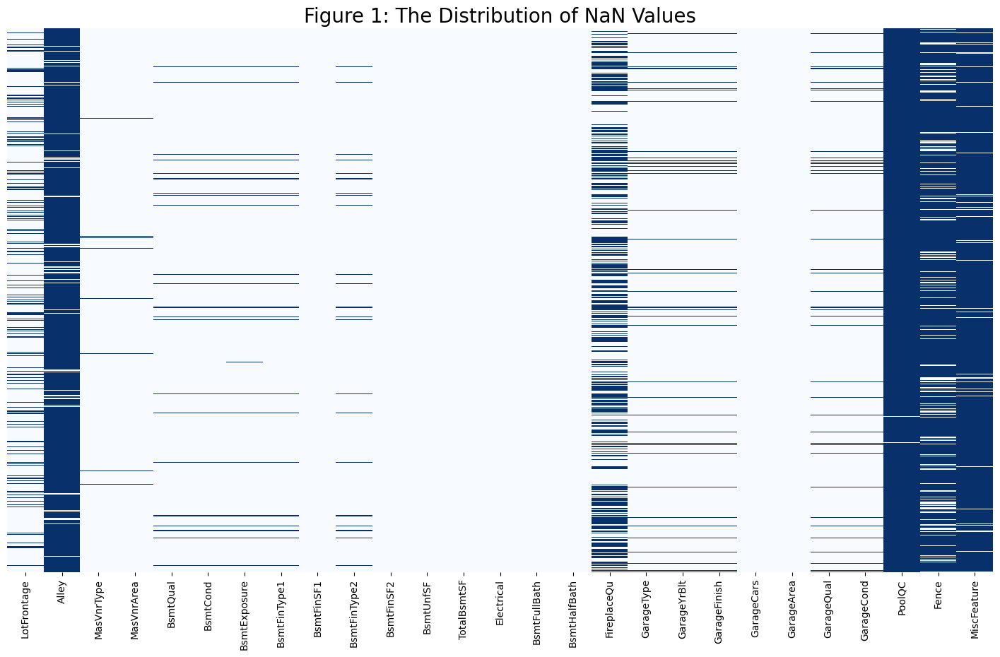

number of categorical variables with missing values: 16
number of numerical variables with missing values: 11
Index(['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC',
       'Fence', 'MiscFeature'],
      dtype='object')
Index(['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'GarageYrBlt',
       'GarageCars', 'GarageArea'],
      dtype='object')


In [3]:
cols_with_nan = data.columns[data.isnull().any()]
cols_with_nan
print("the number of columns with Nan Value is "f'{len(cols_with_nan)}')

fig,ax = plt.subplots(1,1,figsize=(18,10))
h1 = sns.heatmap(data[cols_with_nan].isnull(), yticklabels=False, cbar=False, cmap='Blues', ax=ax)
h1.set_title("Figure 1: The Distribution of NaN Values",fontsize=20)
#h1.set_xlabel("Columns names having Nan Value")

plt.show()

df_missing = data[cols_with_nan]
missing_cat = df_missing.loc[:, df_missing.dtypes == "object"].columns
missing_num = df_missing.loc[:, df_missing.dtypes != "object"].columns

print(f"number of categorical variables with missing values: {len(missing_cat)}")
print(f"number of numerical variables with missing values: {len(missing_num)}")
print(missing_cat)
print(missing_num)


In [4]:
# Fill with None for categorical variables
data[missing_cat] = data[missing_cat].fillna("None") 
    
# Fill with 0 for numerical variables
data[missing_num] = data[missing_num].fillna(0)

# cols_with_nan = data.columns[data.isnull().any()]
# print("the number of columns with Nan Value is "f'{len(cols_with_nan)}')

# Target Variable Analysis

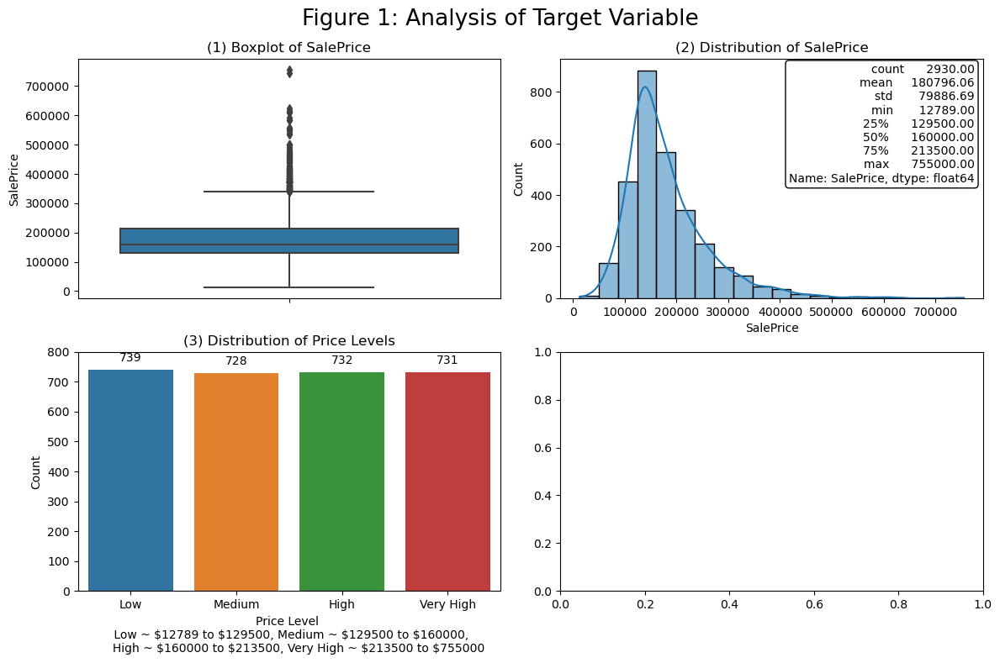

In [5]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))
plt.suptitle("Figure 1: Analysis of Target Variable",fontsize=19)
ax1 = sns.boxplot(data = data, y = 'SalePrice', whis = 1.5,ax=axes[0,0])
ax1.set_title('(1) Boxplot of SalePrice')

des=round(data["SalePrice"].describe(),2)
ax2 = sns.histplot(data, x='SalePrice', bins=20, kde=True,ax=axes[0,1])
ax2.text(0.98, 0.98, f'{des}', transform=ax2.transAxes,
                ha='right', va='top', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))
ax2.set_title('(2) Distribution of SalePrice')


data["PriceLevel"], bins = pd.qcut(data["SalePrice"], q=4, \
    labels=["Low", "Medium", "High", "Very High"], \
    retbins=True, precision=2)

# 绘制柱状图
ax3 = sns.countplot(x="PriceLevel", data=data,ax=axes[1,0])

# 在每个柱形上标注计数值
for p in ax3.patches:
    ax3.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'bottom', xytext = (0, 5), textcoords = 'offset points')
ax3.set_ylim(0,800)

ax3.set_title('(3) Distribution of Price Levels')
ax3.set_xlabel('Price Level \n Low ~ \$12789 to $129500, Medium ~ $129500 to $160000,\n \
    High ~ \$160000 to $213500, Very High ~ $213500 to $755000')
ax3.set_ylabel('Count')
plt.tight_layout()
plt.show()


# Feature Analysis
## Feature of housing size affect price

In [8]:
data1 = data.copy()
data1["GarAreaPerCar"] = (data1["GarageArea"] / data1["GarageCars"]).fillna(0)
data1["GrLivAreaPerRoom"] = data1["GrLivArea"] / data1["TotRmsAbvGrd"]
data1["TotalHouseSF"] = data1["TotalBsmtSF"] + data1["1stFlrSF"] + data1["2ndFlrSF"]
data1["IsRemodGar"] = (data1["GarageYrBlt"] - data1["YearBuilt"]).apply(lambda x: '1' if x > 0 else '0')
# whether Garage is built after house finish: 1 ~yes, 0 ~no
data1['TotalPorchSF'] = data1['OpenPorchSF'] + data1['EnclosedPorch'] + data1['3SsnPorch'] + data1['ScreenPorch']
data1["TotalFullBath"] = data1["FullBath"] + data1["BsmtFullBath"]
data1["IsRemod"] = (data1["YearRemod/Add"] - data1["YearBuilt"]).apply(lambda x: '1' if x > 0 else '0')
#data_temp = data1[cross_abovecols+['IsRemodGar','GarAreaPerCar','GrLivAreaPerRoom','TotalHouseSF','TotalFullBath','TotalPorchSF','IsRemod']]
data1.drop(['GarageYrBlt','GarageArea','GarageCars','GrLivArea','FullBath','TotRmsAbvGrd','TotalBsmtSF','1stFlrSF','OpenPorchSF',"YearRemod/Add"],axis = 1,inplace = True)

In [46]:
MasVnrArea_h = data1["MasVnrArea"][(data1["MasVnrArea"]>0) & (data1["MasVnrArea"]<1600) & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]
MasVnrArea_h

17       350.0
36       162.0
38       450.0
41       615.0
44       760.0
         ...  
2408     572.0
2445    1378.0
2446     877.0
2450     738.0
2902     382.0
Name: MasVnrArea, Length: 126, dtype: float64

In [80]:
LotArea_Q = data1["OverallQual"][(data1["LotArea"] > 0) & (data1["LotArea"] < 75000)]
lot_area_q_counts = LotArea_Q.value_counts()
print(lot_area_q_counts)


5     824
6     731
7     600
8     350
4     226
9     107
3      40
10     31
2      13
1       4
Name: OverallQual, dtype: int64


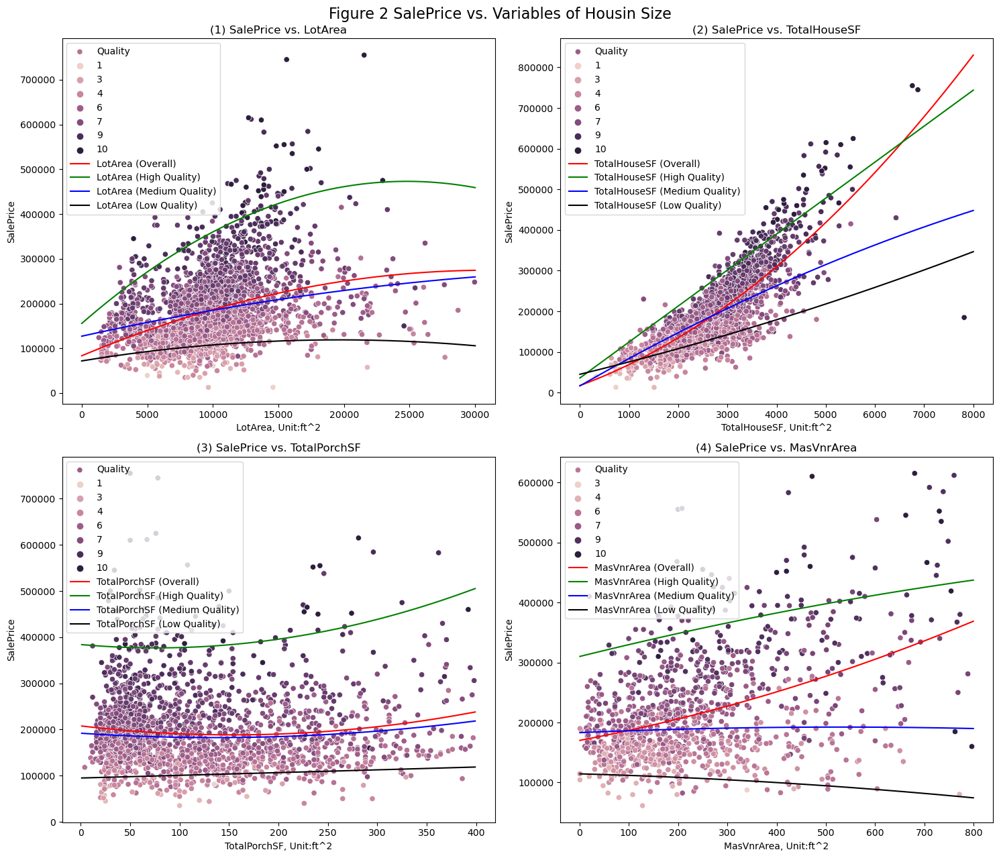

In [105]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

############################## TotalPorchSF #########################
TotalPorchSF = data1["TotalPorchSF"][(data1["TotalPorchSF"] > 0) & (data1["TotalPorchSF"] < 400)]
TotalPorchSF_y = data1["SalePrice"][(data1["TotalPorchSF"] > 0) & (data1["TotalPorchSF"] < 400)]
TotalPorchSF_Q = data1["OverallQual"][(data1["TotalPorchSF"] > 0) & (data1["TotalPorchSF"] < 400)]

TotalPorchSF_h = data1["TotalPorchSF"][(data1["TotalPorchSF"]>0) & (data1["TotalPorchSF"]<400)\
    & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]
TotalPorchSF_yh = data1["SalePrice"][(data1["TotalPorchSF"]>0) &(data1["TotalPorchSF"]<400)\
     & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]

TotalPorchSF_m = data1["TotalPorchSF"][(data1["TotalPorchSF"]>0) & (data1["TotalPorchSF"]<400)\
    & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]
TotalPorchSF_ym = data1["SalePrice"][(data1["TotalPorchSF"]>0) &(data1["TotalPorchSF"]<400)\
     & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]

TotalPorchSF_l = data1["TotalPorchSF"][(data1["TotalPorchSF"]>0) & (data1["TotalPorchSF"]<400)\
    & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4) | (data1["OverallQual"] == 1))]
TotalPorchSF_yl = data1["SalePrice"][(data1["TotalPorchSF"]>0) &(data1["TotalPorchSF"]<400)\
     & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4)| (data1["OverallQual"] == 1))]
############################### LotArea #################################################
LotArea = data1["LotArea"][(data1["LotArea"] > 0) & (data1["LotArea"] < 30000)]
LotArea_y = data1["SalePrice"][(data1["LotArea"] > 0) & (data1["LotArea"] < 30000)]
LotArea_Q = data1["OverallQual"][(data1["LotArea"] > 0) & (data1["LotArea"] < 30000)]

LotArea_h = data1["LotArea"][(data1["LotArea"]>0) & (data1["LotArea"]<30000)\
    & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]
LotArea_yh = data1["SalePrice"][(data1["LotArea"]>0) &(data1["LotArea"]<30000)\
     & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]

LotArea_m = data1["LotArea"][(data1["LotArea"]>0) & (data1["LotArea"]<30000)\
    & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]
LotArea_ym = data1["SalePrice"][(data1["LotArea"]>0) &(data1["LotArea"]<30000)\
     & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]

LotArea_l = data1["LotArea"][(data1["LotArea"]>0) & (data1["LotArea"]<30000)\
    & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4) | (data1["OverallQual"] == 1))]
LotArea_yl = data1["SalePrice"][(data1["LotArea"]>0) &(data1["LotArea"]<30000)\
     & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4)| (data1["OverallQual"] == 1))]

################################ TotalHouseSF ############################################################
TotalHouseSF = data1["TotalHouseSF"][(data1["TotalHouseSF"] > 0) & (data1["TotalHouseSF"] < 8000)]
TotalHouseSF_y = data1["SalePrice"][(data1["TotalHouseSF"] > 0) & (data1["TotalHouseSF"] < 8000)]
TotalHouseSF_Q = data1["OverallQual"][(data1["TotalHouseSF"] > 0) & (data1["TotalHouseSF"] < 8000)]

TotalHouseSF_h = data1["TotalHouseSF"][(data1["TotalHouseSF"]>0) & (data1["TotalHouseSF"]<8000)\
    & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]
TotalHouseSF_yh = data1["SalePrice"][(data1["TotalHouseSF"]>0) &(data1["TotalHouseSF"]<8000)\
     & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]

TotalHouseSF_m = data1["TotalHouseSF"][(data1["TotalHouseSF"]>0) & (data1["TotalHouseSF"]<8000)\
    & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]
TotalHouseSF_ym = data1["SalePrice"][(data1["TotalHouseSF"]>0) &(data1["TotalHouseSF"]<8000)\
     & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]

TotalHouseSF_l = data1["TotalHouseSF"][(data1["TotalHouseSF"]>0) & (data1["TotalHouseSF"]<8000)\
    & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4) | (data1["OverallQual"] == 1))]
TotalHouseSF_yl = data1["SalePrice"][(data1["TotalHouseSF"]>0) &(data1["TotalHouseSF"]<8000)\
     & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4)| (data1["OverallQual"] == 1))]

######################### MasVnrArea #####################################
MasVnrArea = data1["MasVnrArea"][(data1["MasVnrArea"]>0) & (data1["MasVnrArea"]<800)]
MasVnrArea_y = data1["SalePrice"][(data1["MasVnrArea"]>0) &(data1["MasVnrArea"]<800)]
MasVnrArea_Q = data1["OverallQual"][(data1["MasVnrArea"]>0) &(data1["MasVnrArea"]<800)]

MasVnrArea_h = data1["MasVnrArea"][(data1["MasVnrArea"]>0) & (data1["MasVnrArea"]<800)\
    & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]
MasVnrArea_yh = data1["SalePrice"][(data1["MasVnrArea"]>0) &(data1["MasVnrArea"]<800)\
     & ((data1["OverallQual"] == 10) | (data1["OverallQual"] == 9))]

MasVnrArea_m = data1["MasVnrArea"][(data1["MasVnrArea"]>0) & (data1["MasVnrArea"]<800)\
    & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]
MasVnrArea_ym = data1["SalePrice"][(data1["MasVnrArea"]>0) &(data1["MasVnrArea"]<800)\
     & ((data1["OverallQual"] == 6) | (data1["OverallQual"] == 7))]

MasVnrArea_l = data1["MasVnrArea"][(data1["MasVnrArea"]>0) & (data1["MasVnrArea"]<800)\
    & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4))]
MasVnrArea_yl = data1["SalePrice"][(data1["MasVnrArea"]>0) &(data1["MasVnrArea"]<800)\
     & ((data1["OverallQual"] == 3) | (data1["OverallQual"] == 4))]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 13))
################## fit0 #################################
fit0 = np.polyfit(TotalPorchSF, TotalPorchSF_y, 2)
fit_fn0 = np.poly1d(fit0)
fit0h = np.polyfit(TotalPorchSF_h, TotalPorchSF_yh, 2)
fit_fn0h = np.poly1d(fit0h)
fit0m = np.polyfit(TotalPorchSF_m, TotalPorchSF_ym, 2)
fit_fn0m = np.poly1d(fit0m)
fit0l = np.polyfit(TotalPorchSF_l, TotalPorchSF_yl, 2)
fit_fn0l = np.poly1d(fit0l)

fit0_range = range(1,400)   
ax = axes[1, 0]  # obtain subplot index
sns.scatterplot(x = TotalPorchSF, y =  TotalPorchSF_y,ax =ax,hue=TotalPorchSF_Q, label = "Quality")
ax.plot(fit0_range, fit_fn0(fit0_range), color='red',label = "TotalPorchSF (Overall)")
ax.plot(fit0_range, fit_fn0h(fit0_range), color='green',label = "TotalPorchSF (High Quality)")
ax.plot(fit0_range, fit_fn0m(fit0_range), color='blue',label = "TotalPorchSF (Medium Quality)")
ax.plot(fit0_range, fit_fn0l(fit0_range), color='black',label = "TotalPorchSF (Low Quality)")
ax.set_title('(3) SalePrice vs. TotalPorchSF')
ax.set_ylabel('SalePrice')
ax.set_xlabel('TotalPorchSF, Unit:ft^2')  
ax.legend()
################## fit1 ############################
fit1 = np.polyfit(LotArea, LotArea_y, 2)
fit_fn1 = np.poly1d(fit1)
fit1h = np.polyfit(LotArea_h, LotArea_yh, 2)
fit_fn1h = np.poly1d(fit1h)
fit1m = np.polyfit(LotArea_m, LotArea_ym, 2)
fit_fn1m = np.poly1d(fit1m)
fit1l = np.polyfit(LotArea_l, LotArea_yl, 2)
fit_fn1l = np.poly1d(fit1l)

fit1_range = range(1,30000)   
ax = axes[0, 0]  # obtain subplot index
sns.scatterplot(x = LotArea, y =  LotArea_y,ax =ax,hue=LotArea_Q, label = "Quality")
ax.plot(fit1_range, fit_fn1(fit1_range), color='red',label = "LotArea (Overall)")
ax.plot(fit1_range, fit_fn1h(fit1_range), color='green',label = "LotArea (High Quality)")
ax.plot(fit1_range, fit_fn1m(fit1_range), color='blue',label = "LotArea (Medium Quality)")
ax.plot(fit1_range, fit_fn1l(fit1_range), color='black',label = "LotArea (Low Quality)")
ax.set_title('(1) SalePrice vs. LotArea')
ax.set_ylabel('SalePrice')
ax.set_xlabel('LotArea, Unit:ft^2')  
ax.legend()
################## fit2 ############################
fit2 = np.polyfit(TotalHouseSF, TotalHouseSF_y, 2)
fit_fn2 = np.poly1d(fit2)
fit2h = np.polyfit(TotalHouseSF_h, TotalHouseSF_yh, 1)
fit_fn2h = np.poly1d(fit2h)
fit2m = np.polyfit(TotalHouseSF_m, TotalHouseSF_ym, 2)
fit_fn2m = np.poly1d(fit2m)
fit2l = np.polyfit(TotalHouseSF_l, TotalHouseSF_yl, 2)
fit_fn2l = np.poly1d(fit2l)

fit2_range = range(1,8000)   
ax = axes[0, 1]  # obtain subplot index
sns.scatterplot(x = TotalHouseSF, y =  TotalHouseSF_y,ax =ax,hue=TotalHouseSF_Q, label = "Quality")
ax.plot(fit2_range, fit_fn2(fit2_range), color='red',label = "TotalHouseSF (Overall)")
ax.plot(fit2_range, fit_fn2h(fit2_range), color='green',label = "TotalHouseSF (High Quality)")
ax.plot(fit2_range, fit_fn2m(fit2_range), color='blue',label = "TotalHouseSF (Medium Quality)")
ax.plot(fit2_range, fit_fn2l(fit2_range), color='black',label = "TotalHouseSF (Low Quality)")
ax.set_title('(2) SalePrice vs. TotalHouseSF')
ax.set_ylabel('SalePrice')
ax.set_xlabel('TotalHouseSF, Unit:ft^2')  
ax.legend()

################## fit3 ############################
fit3 = np.polyfit(MasVnrArea, MasVnrArea_y, 2)
fit_fn3 = np.poly1d(fit3)
fit3h = np.polyfit(MasVnrArea_h, MasVnrArea_yh, 2)
fit_fn3h = np.poly1d(fit3h)
fit3m = np.polyfit(MasVnrArea_m, MasVnrArea_ym, 2)
fit_fn3m = np.poly1d(fit3m)
fit3l = np.polyfit(MasVnrArea_l, MasVnrArea_yl, 2)
fit_fn3l = np.poly1d(fit3l)

fit3_range = range(1,800)   
ax = axes[1, 1]  # obtain subplot index
sns.scatterplot(x = MasVnrArea, y =  MasVnrArea_y,ax =ax,hue=MasVnrArea_Q, label = "Quality")
ax.plot(fit3_range, fit_fn3(fit3_range), color='red',label = "MasVnrArea (Overall)")
ax.plot(fit3_range, fit_fn3h(fit3_range), color='green',label = "MasVnrArea (High Quality)")
ax.plot(fit3_range, fit_fn3m(fit3_range), color='blue',label = "MasVnrArea (Medium Quality)")
ax.plot(fit3_range, fit_fn3l(fit3_range), color='black',label = "MasVnrArea (Low Quality)")
ax.set_title('(4) SalePrice vs. MasVnrArea')
ax.set_ylabel('SalePrice')
ax.set_xlabel('MasVnrArea, Unit:ft^2')  
ax.legend()
fig.suptitle("Figure 2 SalePrice vs. Variables of Housin Size", fontsize=16)
plt.tight_layout()
plt.show()



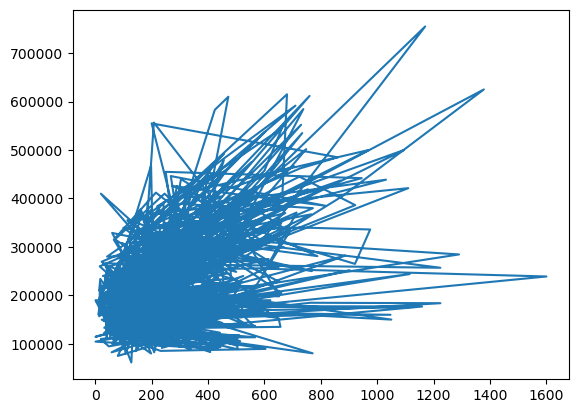

In [25]:
LotArea = data1["MasVnrArea"][(data1["MasVnrArea"]>0) & (data1["MasVnrArea"]<8000)]
LotArea_y = data1["SalePrice"][(data1["MasVnrArea"]>0) &(data1["MasVnrArea"]<8000)]
plt.plot(LotArea, LotArea_y, label='LotArea')

## Features of Quality

OverallQual 5     825
6     732
7     602
8     350
4     226
9     107
3      40
10     31
2      13
1       4
Name: OverallQual, dtype: int64
OverallCond 5    1654
6     533
7     390
8     144
4     101
3      50
9      41
2      10
1       7
Name: OverallCond, dtype: int64
HeatingQC Ex    1495
TA     864
Gd     476
Fa      92
Po       3
Name: HeatingQC, dtype: int64
KitchenQual TA    1494
Gd    1160
Ex     205
Fa      70
Po       1
Name: KitchenQual, dtype: int64
BsmtQual TA     1283
Gd     1219
Ex      258
Fa       88
NaN      80
Po        2
Name: BsmtQual, dtype: int64
GarageQual TA     2615
NaN     159
Fa      124
Gd       24
Po        5
Ex        3
Name: GarageQual, dtype: int64


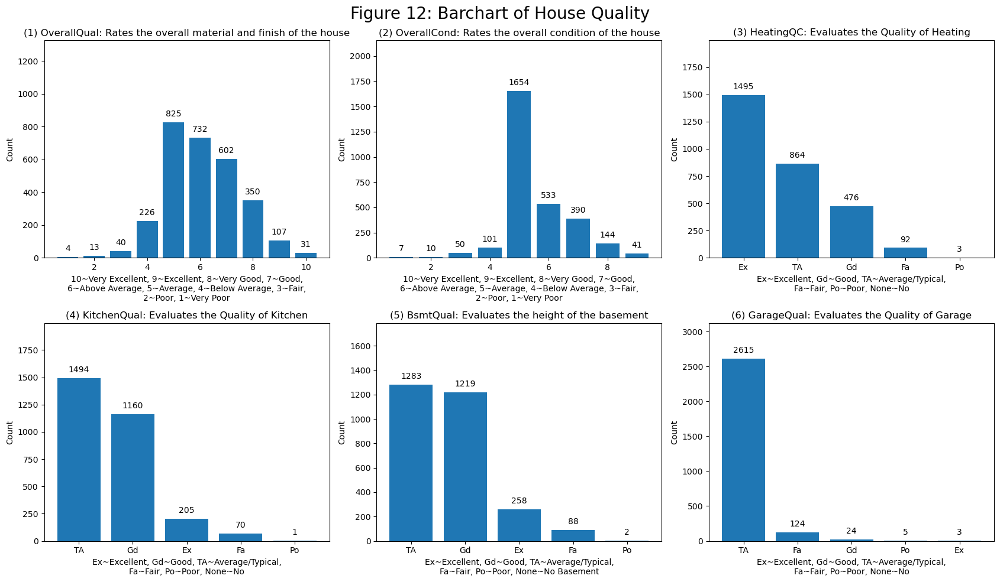

In [106]:
lst_quality = ["OverallQual","OverallCond",'HeatingQC','KitchenQual','BsmtQual','GarageQual']
data_quality= data[lst_quality]
value_counts = []
for i in lst_quality:
    value_counts_temp = data[i].value_counts(dropna=False)
    print(i,value_counts_temp)
    value_counts.append(value_counts_temp)

title_OverallQual = '''OverallQual: Rates the overall material and finish of the house'''
str_OverallQual = '''10~Very Excellent, 9~Excellent, 8~Very Good, 7~Good,
6~Above Average, 5~Average, 4~Below Average, 3~Fair,
2~Poor, 1~Very Poor'''
	
title_OverallCond = '''OverallCond: Rates the overall condition of the house'''
str_OverallCond = '''10~Very Excellent, 9~Excellent, 8~Very Good, 7~Good,
6~Above Average, 5~Average, 4~Below Average, 3~Fair,
2~Poor, 1~Very Poor'''

title_BsmtQual = '''BsmtQual: Evaluates the height of the basement'''
str_BsmtQual = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No Basement'''
		
title_HeatingQC = '''HeatingQC: Evaluates the Quality of Heating'''
str_HeatingQC = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No'''

title_KitchenQual = '''KitchenQual: Evaluates the Quality of Kitchen'''
str_KitchenQual = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No'''

title_GarageQual = '''GarageQual: Evaluates the Quality of Garage'''
str_GarageQual = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No'''
title = [title_OverallQual,title_OverallCond,title_HeatingQC,title_KitchenQual,title_BsmtQual,title_GarageQual]
str_ = [str_OverallQual,str_OverallCond,str_HeatingQC,str_KitchenQual,str_BsmtQual,str_GarageQual]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17, 10))

fig.suptitle('Figure 12: Barchart of House Quality',fontsize=20)

for i, column in enumerate(data_quality):
   
    value_counts_location = data_quality[column].value_counts()
    
    ax = axes[i//3, i%3]  
    ax.bar(value_counts_location.index, value_counts_location.values)
    ax.set_title(f"({i+1}) "+title[i])

    ax.set_xlabel(str_[i])
    ax.set_ylabel('Count')
    
    ax.set_ylim(0,max(data_quality[column].value_counts())+500)
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'bottom', xytext = (0, 5), textcoords = 'offset points')
plt.tight_layout()
plt.show()

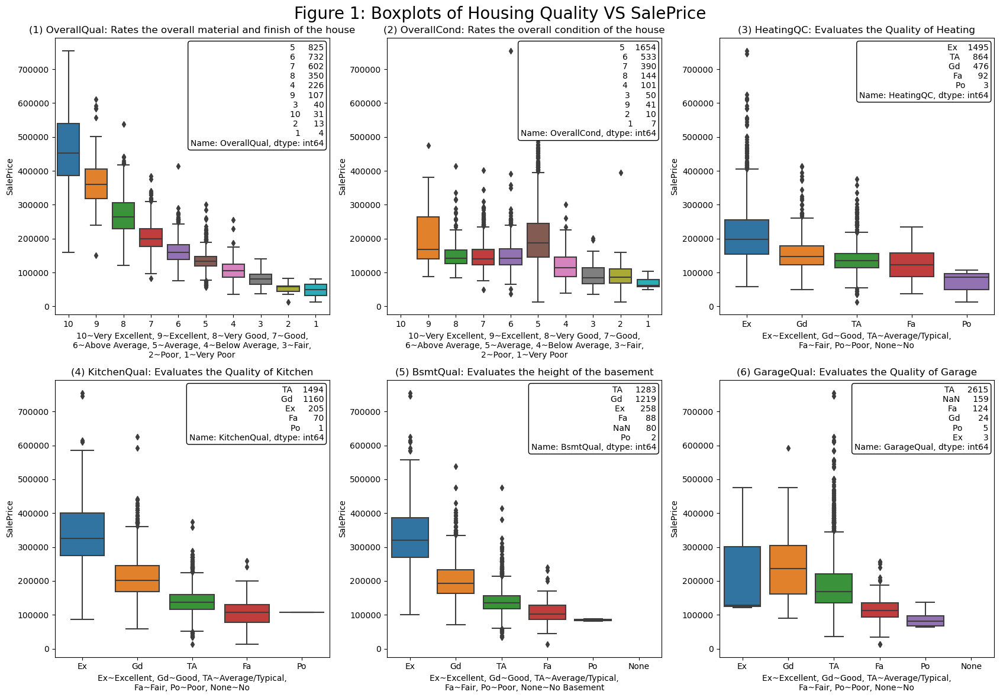

In [107]:
data_boxplot = pd.concat([data_quality, data['SalePrice']], axis=1)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17, 12))

fig.suptitle('Figure 1: Boxplots of Housing Quality VS SalePrice',fontsize=20)

for i, column in enumerate(data_quality):
    if i == 1 or i == 0:
        order = list(range(10, 0, -1))
    elif i ==2 or i == 3:
        order = ['Ex','Gd',	'TA','Fa','Po']
    else:
        order = ['Ex','Gd',	'TA','Fa','Po','None']
    ax = axes[i//3, i%3]  
    sns.boxplot(x=column, y='SalePrice', data=data_boxplot,ax=ax,order=order)
    
    ax.set_title(f"({i+1}) {title[i]}")
    
    ax.set_xlabel(str_[i])
    ax.set_ylabel('SalePrice')
    ax.text(0.98, 0.98, f'{value_counts[i]}', transform=ax.transAxes,
                ha='right', va='top', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

plt.tight_layout()
plt.show()

## feature of Housetype and zoning

MSZoning RL         2273
RM          462
FV          139
RH           27
C (all)      25
I (all)       2
A (agr)       2
Name: MSZoning, dtype: int64
HouseStyle 1Story    1481
2Story     873
1.5Fin     314
SLvl       128
SFoyer      83
2.5Unf      24
1.5Unf      19
2.5Fin       8
Name: HouseStyle, dtype: int64
GarageType Attchd     1731
Detchd      782
BuiltIn     186
NaN         157
Basment      36
2Types       23
CarPort      15
Name: GarageType, dtype: int64
LotShape Reg    1859
IR1     979
IR2      76
IR3      16
Name: LotShape, dtype: int64


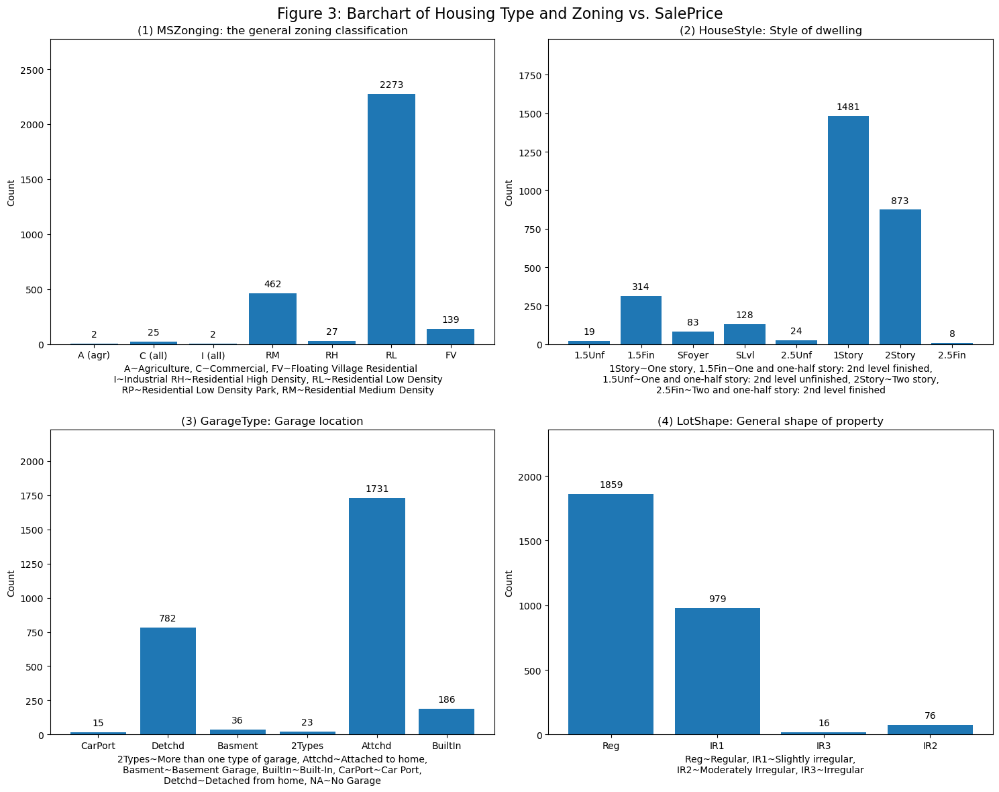

In [116]:
lst_location = ["MSZoning","HouseStyle","GarageType","LotShape"]
data_location = data1[lst_location]
value_counts = []
for i in lst_location:
    value_counts_temp = data[i].value_counts(dropna=False)
    print(i,value_counts_temp)
    value_counts.append(value_counts_temp)
    
str_MSZonging = '''A~Agriculture, C~Commercial, FV~Floating Village Residential 
    I~Industrial RH~Residential High Density, RL~Residential Low Density
    RP~Residential Low Density Park, RM~Residential Medium Density
    '''
title_MSZonging = '''MSZonging: the general zoning classification'''

str_HouseStyle = '''1Story~One story, 1.5Fin~One and one-half story: 2nd level finished,
1.5Unf~One and one-half story: 2nd level unfinished, 2Story~Two story,
2.5Fin~Two and one-half story: 2nd level finished'''
title_HouseStyle = '''HouseStyle: Style of dwelling'''

title_GarageType='''GarageType: Garage location'''
str_GarageType = '''2Types~More than one type of garage, Attchd~Attached to home,
Basment~Basement Garage, BuiltIn~Built-In, CarPort~Car Port,
Detchd~Detached from home, NA~No Garage'''

title_LotShape ='''LotShape: General shape of property'''   
str_LotShape = '''Reg~Regular, IR1~Slightly irregular,
IR2~Moderately Irregular, IR3~Irregular'''

	   

	   
title = [title_MSZonging,title_HouseStyle,title_GarageType,title_LotShape]
str_ = [str_MSZonging,str_HouseStyle,str_GarageType,str_LotShape]


fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 12))

fig.suptitle('Figure 3: Barchart of Housing Type and Zoning vs. SalePrice', fontsize=16)

# 计算每个分类的均值并进行排序
mean_values = [data1.groupby(column)["SalePrice"].mean().sort_values() for column in lst_location]

for i, column in enumerate(data_location):
    value_counts_location = data_location[column].value_counts()
    sorted_categories = mean_values[i].index

    ax = axes[i//2, i%2]
    ax.bar(sorted_categories, value_counts_location[sorted_categories])
    ax.set_title(f"({i+1}) " + title[i])

    ax.set_xlabel(str_[i])
    ax.set_ylabel('Count')

    ax.set_ylim(0, max(data_location[column].value_counts()) + 500)
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', xytext=(0, 5), textcoords='offset points')
plt.tight_layout()
plt.show()



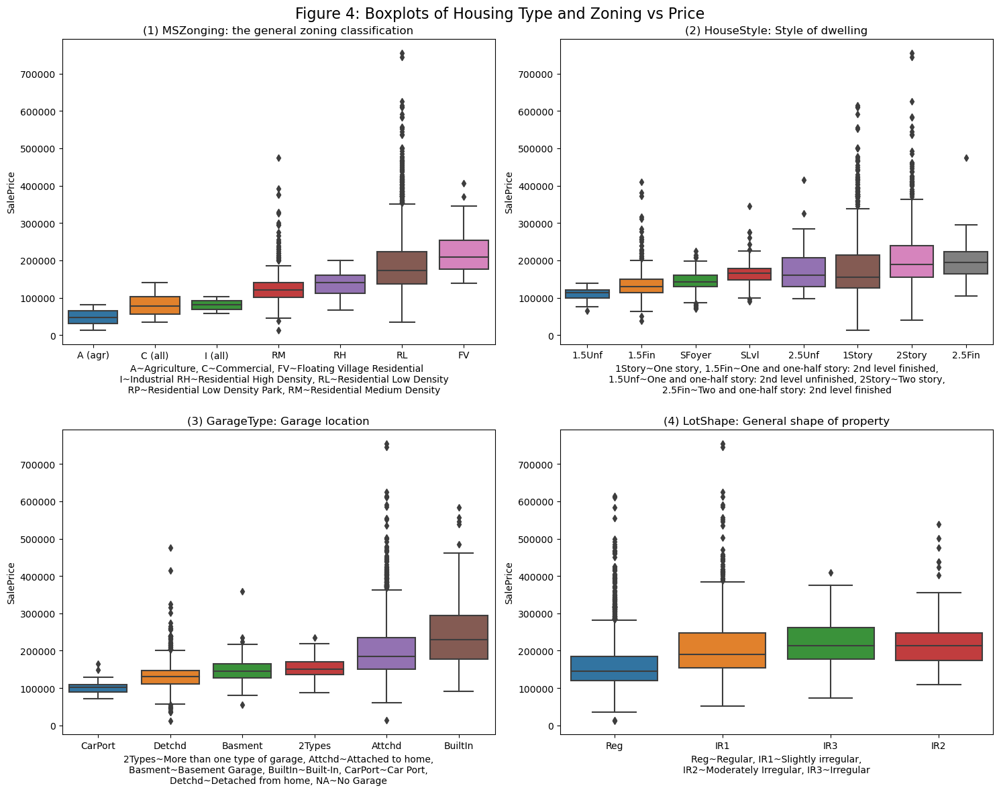

In [115]:
data_boxplot = pd.concat([data_location, data['SalePrice']], axis=1)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 12))

fig.suptitle('Figure 4: Boxplots of Housing Type and Zoning vs Price', fontsize=16)

# 计算每个分类的均值并进行排序
mean_values = [data1.groupby(column)["SalePrice"].mean().sort_values() for column in lst_location]

for i, column in enumerate(data_location):
    ax = axes[i//2, i%2]
    sns.boxplot(x=column, y='SalePrice', data=data_boxplot, ax=ax, order=mean_values[i].index)
    
    ax.set_title(f"({i+1}) {title[i]}")
    
    ax.set_xlabel(str_[i])
    ax.set_ylabel('SalePrice')

plt.tight_layout()
plt.show()


In [ ]:
# RQ2

In [126]:
mean_values = [data1.groupby("YearBuilt")["SalePrice"].mean()]

print(len(mean_values))
a = data1["YearBuilt"].unique()
print(a.shape)
#np.plot(mean_values)

1
(118,)


YearBuilt
1872    122000.000000
1875     94000.000000
1879    185000.000000
1880    186695.800000
1882    168000.000000
1885    111250.000000
1890    145700.000000
1892    291250.000000
1893    325000.000000
1895    118866.666667
1896     50138.000000
1898    106000.000000
1900    117897.448276
1901    115000.000000
1902     97500.000000
1904    157500.000000
1905    129766.666667
1906    135000.000000
1907     93369.000000
1908    183500.000000
1910    111761.139535
1911    130000.000000
1912    120660.000000
1913     90350.000000
1914    128735.875000
1915    134293.750000
1916    134390.000000
1917    118666.666667
1918    160845.000000
1919    140700.000000
1920    111681.421053
1921    133852.727273
1922    106771.875000
1923    131011.647059
1924    114150.000000
1925    125570.588235
1926    126510.526316
1927    125277.777778
1928    146877.777778
1929    145125.000000
1930    118823.076923
1931    122842.857143
1932    226586.800000
1934    171020.000000
1935    188621.230769


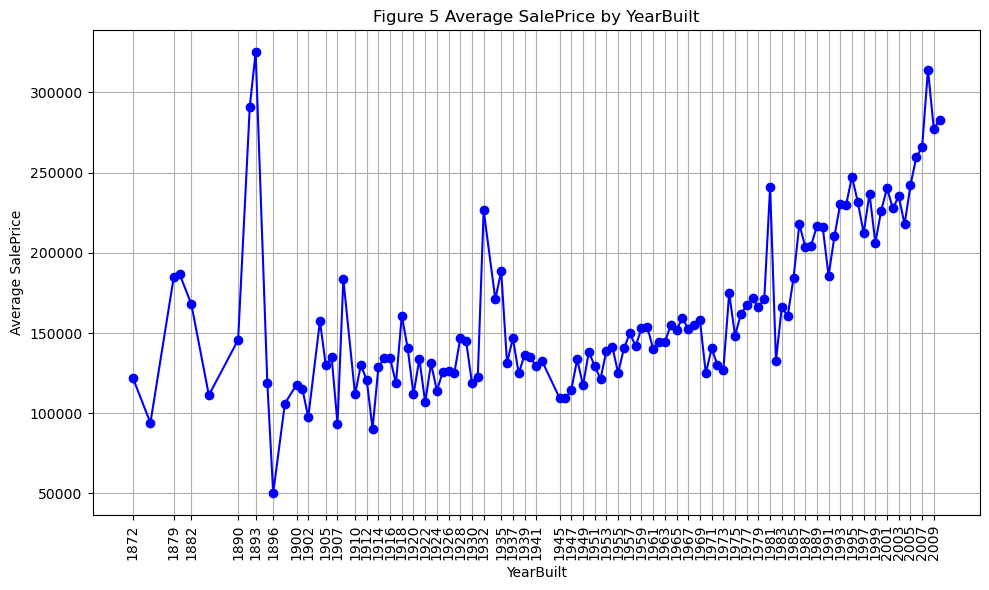

In [144]:
import pandas as pd
import matplotlib.pyplot as plt

# 按照"YearBuilt"分组并计算平均值
mean_values = data1.groupby("YearBuilt")["SalePrice"].mean()
with pd.option_context('display.max_rows', None):
    print(mean_values)
    
# 创建曲线图
plt.figure(figsize=(10, 6))
plt.plot(mean_values.index, mean_values.values, marker='o', linestyle='-', color='b')
plt.title("Figure 5 Average SalePrice by YearBuilt")
plt.xlabel("YearBuilt")
plt.ylabel("Average SalePrice")
plt.grid(True)

# 手动设置X轴刻度，以显示每个年份
plt.xticks(mean_values.index[0:-1:2], rotation=90)

plt.tight_layout()
plt.show()



In [143]:
data1[(data1["YearBuilt"] == 1892) | (data1["YearBuilt"] == 1893)|(data1["YearBuilt"] == 1896)].

print(data1[(data1["YearBuilt"] == 1892) | (data1["YearBuilt"] == 1893)|(data1["YearBuilt"] == 1896)] )
print(data1[ (data1["YearBuilt"] == 1932) |(data1["YearBuilt"] == 1935) ])

      Order        PID  MSSubClass MSZoning  LotFrontage  LotArea Street  \
307     308  911204100          30  C (all)         66.0     8712   Grvl   
699     700  902106060          70       RM         60.0     6600   Pave   
1320   1321  902401120          75       RM         75.0    13500   Pave   
2666   2667  902400110          75       RM         90.0    22950   Pave   

     Alley LotShape LandContour  ... SaleType SaleCondition SalePrice  \
307    NaN      Reg         Lvl  ...      WD         Alloca     50138   
699    NaN      Reg         Lvl  ...      WD         Normal    107500   
1320   NaN      Reg         Lvl  ...      WD         Normal    325000   
2666   NaN      IR2         Lvl  ...      WD         Normal    475000   

     GarAreaPerCar GrLivAreaPerRoom TotalHouseSF IsRemodGar TotalPorchSF  \
307          330.0       190.400000       1708.0          0          265   
699          432.0       215.636364       3366.0          1          287   
1320         440.0       

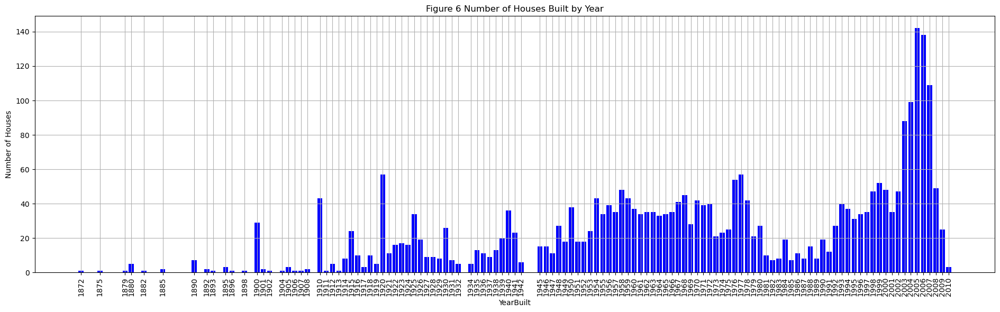

In [199]:
import pandas as pd
import matplotlib.pyplot as plt

# 计算每个年份的个数
year_counts = data1["YearBuilt"].value_counts()

# 创建柱状图
plt.figure(figsize=(19, 6))
plt.bar(year_counts.index, year_counts.values, color='b')
plt.title("Figure 6 Number of Houses Built by Year")
plt.xlabel("YearBuilt")
plt.ylabel("Number of Houses")
plt.grid(True)

# 手动设置X轴刻度，以显示每个年份
plt.xticks(year_counts.index, rotation=90)

plt.tight_layout()
plt.show()


In [145]:
from sklearn.model_selection import train_test_split,cross_val_score, KFold,validation_curve,GridSearchCV
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import r2_score as r2
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor


data_reg=pd.read_excel('data_reg.xlsx')
data_class=pd.read_excel('data_class.xlsx')
data_reg_prep=pd.read_excel('data_reg_prep.xlsx')
data_class_prep=pd.read_excel('data_class_prep.xlsx')

data_reg_temp = data_reg.drop("SalePrice",axis = 1)
cols_temp = ["OverallQual","OverallCond","IsRemodGar","IsRemod"]
data_reg_temp[cols_temp]=data_reg_temp[cols_temp].astype("object")

cat_cols = data_reg_temp.select_dtypes(include = "object").columns.tolist()
print(len(cat_cols))
print(cat_cols)

num_cols = data_reg_temp.select_dtypes(include="number").columns.tolist()
print(len(num_cols))
print(num_cols)

Xtrain,Xtest,Ytrain,Ytest = train_test_split(data_reg_temp,data_reg["SalePrice"],test_size =0.3,random_state=0)
Xtrain = Xtrain.sort_index()
Xtest = Xtest.sort_index()
Ytrain= Ytrain.sort_index()
Ytest = Ytest.sort_index()

Xtrain_index = Xtrain.index.tolist()
Xtest_index = Xtest.index.tolist()

Xtrain_cat = Xtrain[cat_cols]

Xtrain_num = Xtrain[num_cols]
train_mean= Xtrain_num.mean()
train_std = np.sqrt(Xtrain_num.var())

Xtest_cat = Xtest[cat_cols]
Xtest_num = Xtest[num_cols]

Xtrain_num_std = Xtrain_num.apply(lambda x: (x - x.mean()) / np.sqrt(x.var())) 
Xtest_num_std = Xtest_num.copy()
for i in num_cols:
    Xtest_num_std[i] = (Xtest_num_std[i] - train_mean[i]) / train_std[i]

#axis = 0 caculate the mean or var through columns ,which is the default value in apply
# data_num_nor = data_num[numeric_cols].apply(lambda x: (x - x.min()) / (x.max(axis=0) - x.min(axis=0)))

#dummy的话最好一起dummy，因为有可能 test dataset 没有一些分类，导致train和test 的dummy的维度不一致

cat_dummy = data_reg_temp[cat_cols].copy()
for i in cat_cols:
    dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
    cat_dummy = pd.concat([cat_dummy,dummy_df], axis=1)
    cat_dummy = cat_dummy.drop(i, axis = 1)
print(cat_dummy.shape) 

Xtest_cat_dummy = cat_dummy.iloc[Xtest_index,:]
Xtrain_cat_dummy = cat_dummy.iloc[Xtrain_index,:]

Xtrain_lr = pd.concat((Xtrain_num_std,Xtrain_cat_dummy),axis = 1)
Xtest_lr = pd.concat((Xtest_num_std,Xtest_cat_dummy),axis = 1)
Ytrain_lr = Ytrain
Ytest_lr = Ytest

Xtrain_tree = pd.concat((Xtrain_num,Xtrain_cat),axis = 1)
Xtest_tree = pd.concat((Xtest_num,Xtest_cat),axis = 1)
Ytrain_tree = data_class.iloc[Xtrain_index,:]["PriceLevel"]
Ytest_tree = data_class.iloc[Xtest_index,:]["PriceLevel"]


# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Iterate through each column in Xtrain_tree
for column in Xtrain_tree.columns:
    # Check if the column is categorical (object data type)
    if Xtrain_tree[column].dtype == 'object':
        # Fit and transform the column with LabelEncoder
        Xtrain_tree[column] = label_encoder.fit_transform(Xtrain_tree[column])

for column in Xtest_tree.columns:
    # Check if the column is categorical (object data type)
    if Xtest_tree[column].dtype == 'object':
        # Fit and transform the column with LabelEncoder
        Xtest_tree[column] = label_encoder.fit_transform(Xtest_tree[column])

# Now Xtrain_tree contains the label-encoded categorical variables


20
['MSZoning', 'LotShape', 'HouseStyle', 'OverallQual', 'OverallCond', 'Exterior1st', 'MasVnrType', 'Foundation', 'BsmtQual', 'HeatingQC', 'CentralAir', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageQual', 'PavedDrive', 'SaleType', 'SaleCondition', 'IsRemodGar', 'IsRemod']
9
['LotArea', 'YearBuilt', 'MasVnrArea', 'Fireplaces', 'GarAreaPerCar', 'GrLivAreaPerRoom', 'TotalHouseSF', 'TotalFullBath', 'TotalPorchSF']
(2930, 125)


C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\4112145561.py:62: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\4112145561.py:62: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\4112145561.py:62: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\4112145561.py:62: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when

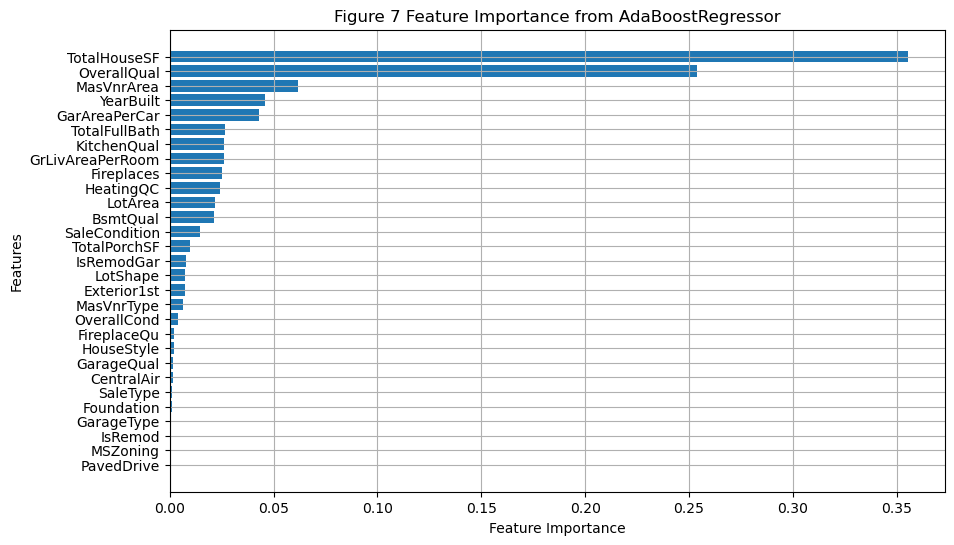

In [200]:
regr = AdaBoostRegressor(random_state=0, n_estimators=530,learning_rate=1.2)
regr.fit(Xtrain_tree, Ytrain_lr)
regr.score(Xtrain_tree, Ytrain_lr)

feature_importance = regr.feature_importances_

# 获取特征名字（假设Xtrain_tree是一个DataFrame）
feature_names = Xtrain_tree.columns

# 对特征重要性进行排序
sorted_idx = np.argsort(feature_importance)

# 绘制特征重要性条形图
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Figure 7 Feature Importance from AdaBoostRegressor')
plt.grid()
plt.show()








In [190]:
year_data = Xtrain_tree.copy()
year_data[(year_data["TotalHouseSF"] > 3400) & (year_data["OverallQual"] >= 9)]


,LotArea,YearBuilt,MasVnrArea,Fireplaces,GarAreaPerCar,GrLivAreaPerRoom,TotalHouseSF,TotalFullBath,TotalPorchSF,MSZoning,...,CentralAir,KitchenQual,FireplaceQu,GarageType,GarageQual,PavedDrive,SaleType,SaleCondition,IsRemodGar,IsRemod
420,12456,2006,230,1,262.000000,245.428571,3418,3,48,5,...,1,0,2,1,5,2,9,4,1,1
423,15431,2008,200,2,224.000000,240.200000,5496,3,242,5,...,1,0,2,1,5,2,9,4,0,0
430,12220,2009,305,1,300.000000,224.444444,4026,3,54,5,...,1,0,2,1,5,2,6,5,0,0
431,13478,2008,420,1,280.666667,229.600000,4018,3,274,5,...,1,0,2,3,5,2,4,4,0,0
432,13693,2007,472,2,254.000000,334.250000,5304,4,50,5,...,1,0,2,1,5,2,9,4,0,0
447,13472,2003,922,1,322.666667,299.000000,4784,2,105,5,...,1,0,0,1,5,2,9,4,0,0
456,14836,2004,730,1,316.333333,311.500000,4984,3,235,5,...,1,0,0,1,5,2,9,0,0,1
1051,12474,2007,272,1,282.000000,259.111111,4014,3,134,5,...,1,0,0,3,5,2,6,5,1,1
1320,13500,1893,0,1,440.000000,308.333333,4012,3,502,6,...,1,2,2,5,2,2,9,4,1,1
1498,63887,2008,796,3,709.000000,470.166667,11752,4,292,5,...,1,0,2,1,5,2,6,5,0,0


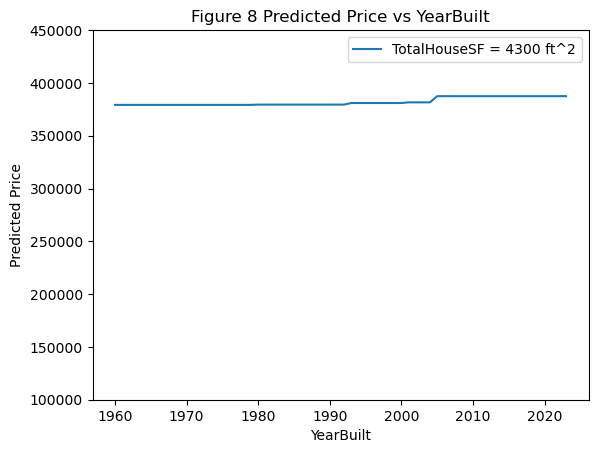

In [336]:
plt.plot(year_lst,price_year,label = "TotalHouseSF = 4300 ft^2")
plt.yticks(np.arange(100000, 450001, 50000))
plt.legend(loc="upper right")
plt.xlabel("YearBuilt")
plt.ylabel("Predicted Price")
plt.title("Figure 8 Predicted Price vs YearBuilt")
plt.show()

In [338]:
year_lst

[2023,
 2022,
 2021,
 2020,
 2019,
 2018,
 2017,
 2016,
 2015,
 2014,
 2013,
 2012,
 2011,
 2010,
 2009,
 2008,
 2007,
 2006,
 2005,
 2004,
 2003,
 2002,
 2001,
 2000,
 1999,
 1998,
 1997,
 1996,
 1995,
 1994,
 1993,
 1992,
 1991,
 1990,
 1989,
 1988,
 1987,
 1986,
 1985,
 1984,
 1983,
 1982,
 1981,
 1980,
 1979,
 1978,
 1977,
 1976,
 1975,
 1974,
 1973,
 1972,
 1971,
 1970,
 1969,
 1968,
 1967,
 1966,
 1965,
 1964,
 1963,
 1962,
 1961,
 1960]

d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.w

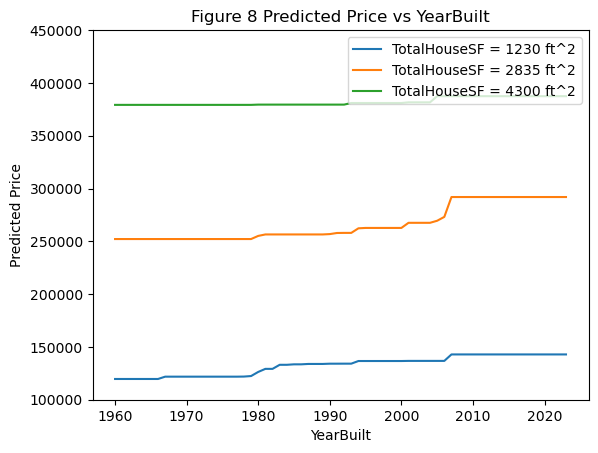

In [337]:
year_data = Xtrain_tree.copy()

# print(year_data.loc[2927, :])


year_lst=list(range(1960,2024))

price_year = []
for i in year_lst:
    year_data.loc[2927, "YearBuilt"] = i
    price_year.append(np.round(regr.predict(np.array(year_data.loc[2927, :]).reshape(1, -1)),2)) 

plt.plot(year_lst,price_year,label = "TotalHouseSF = 1230 ft^2")

price_year = []
for i in year_lst:
    year_data.loc[105, "YearBuilt"] = i
    price_year.append(np.round(regr.predict(np.array(year_data.loc[105, :]).reshape(1, -1)),2)) 

plt.plot(year_lst,price_year,label = "TotalHouseSF = 2835 ft^2")


price_year = []
for i in year_lst:
    year_data.loc[430, "YearBuilt"] = i
    price_year.append(np.round(regr.predict(np.array(year_data.loc[430, :]).reshape(1, -1)),2)) 

plt.plot(year_lst,price_year,label = "TotalHouseSF = 4300 ft^2")
plt.yticks(np.arange(100000, 450001, 50000))
plt.legend(loc="upper right")
plt.xlabel("YearBuilt")
plt.ylabel("Predicted Price")
plt.title("Figure 8 Predicted Price vs YearBuilt")
plt.show()


d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.w

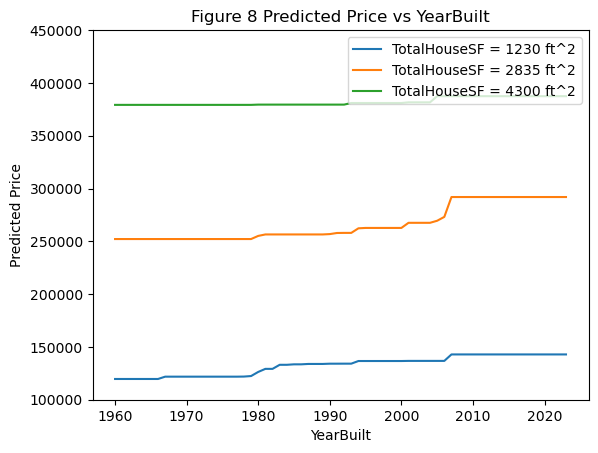

In [339]:
year_lst = list(range(1960, 2024))

# Reverse the year_lst to have it in descending order
year_lst.reverse()

price_year = []
for i in year_lst:
    year_data.loc[2927, "YearBuilt"] = i
    price_year.append(np.round(regr.predict(np.array(year_data.loc[2927, :]).reshape(1, -1)), 2)) 

plt.plot(year_lst, price_year, label="TotalHouseSF = 1230 ft^2")

price_year = []
for i in year_lst:
    year_data.loc[105, "YearBuilt"] = i
    price_year.append(np.round(regr.predict(np.array(year_data.loc[105, :]).reshape(1, -1)), 2)) 

plt.plot(year_lst, price_year, label="TotalHouseSF = 2835 ft^2")

price_year = []
for i in year_lst:
    year_data.loc[430, "YearBuilt"] = i
    price_year.append(np.round(regr.predict(np.array(year_data.loc[430, :]).reshape(1, -1)), 2)) 

plt.plot(year_lst, price_year, label="TotalHouseSF = 4300 ft^2")
plt.yticks(np.arange(100000, 450001, 50000))
plt.legend(loc="upper right")
plt.xlabel("YearBuilt")
plt.ylabel("Predicted Price")
plt.title("Figure 8 Predicted Price vs YearBuilt")
plt.show()


d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.w

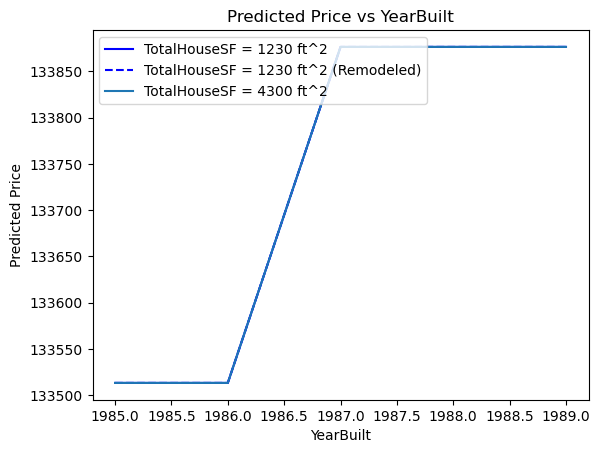

In [198]:
year_data = Xtrain_tree.copy()

# print(year_data.loc[2927, :])


year_lst=list(range(1985,1990))
year_lst
price_year_re = []
price_year = []
for i in year_lst:
    year_data.loc[2927, "YearBuilt"] = i
    year_data.loc[2927, "IsRemod"] = 0
    price_year.append(np.round(regr.predict(np.array(year_data.loc[2927, :]).reshape(1, -1)),2)) 
    year_data.loc[2927, "IsRemod"] = 1
    price_year_re.append(np.round(regr.predict(np.array(year_data.loc[2927, :]).reshape(1, -1)),2))

plt.plot(year_lst,price_year,color='blue',label = "TotalHouseSF = 1230 ft^2")
plt.plot(year_lst, price_year_re, linestyle='dashed', color='blue', label="TotalHouseSF = 1230 ft^2 (Remodeled)")

# price_year = []
# for i in year_lst:
#     year_data.loc[105, "YearBuilt"] = i
#     price_year.append(np.round(regr.predict(np.array(year_data.loc[105, :]).reshape(1, -1)),2)) 

# plt.plot(year_lst,price_year,label = "TotalHouseSF = 2835 ft^2")


# price_year = []
# for i in year_lst:
#     year_data.loc[430, "YearBuilt"] = i
#     price_year.append(np.round(regr.predict(np.array(year_data.loc[430, :]).reshape(1, -1)),2)) 

plt.plot(year_lst,price_year,label = "TotalHouseSF = 4300 ft^2")
#plt.yticks(np.arange(100000, 550001, 50000))
plt.legend(loc="upper left")
plt.xlabel("YearBuilt")
plt.ylabel("Predicted Price")
plt.title("Predicted Price vs YearBuilt")
plt.show()


# analysis of RQ3

In [203]:
year_data[(year_data["TotalHouseSF"] > 2400) & (year_data["OverallQual"] >= 9) & \
    (year_data["TotalFullBath"] ==2 & (year_data["TotalFullBath"] ==2))  ]

,LotArea,YearBuilt,MasVnrArea,Fireplaces,GarAreaPerCar,GrLivAreaPerRoom,TotalHouseSF,TotalFullBath,TotalPorchSF,MSZoning,...,CentralAir,KitchenQual,FireplaceQu,GarageType,GarageQual,PavedDrive,SaleType,SaleCondition,IsRemodGar,IsRemod


True

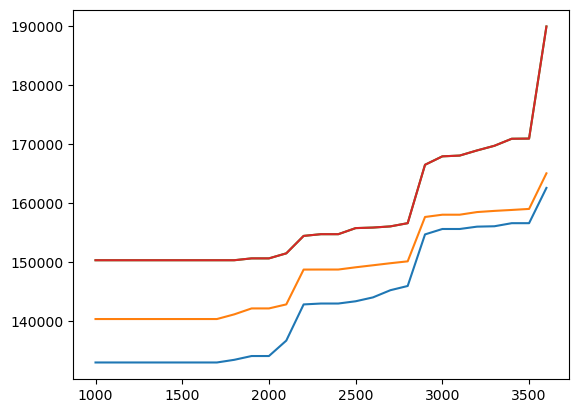

In [225]:
len(price_year)
len(price_year_lst)
plt.plot(year_lst,price_year_lst[0],label = f"TotalFullBath = {i+1}")
plt.plot(year_lst,price_year_lst[1],label = f"TotalFullBath = {i+1}")
plt.plot(year_lst,price_year_lst[2],label = f"TotalFullBath = {i+1}")
plt.plot(year_lst,price_year_lst[3],label = f"TotalFullBath = {i+1}")

price_year_lst[3] == price_year_lst[2]

d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.warn(
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostRegressor was fitted with feature names
  warnings.w

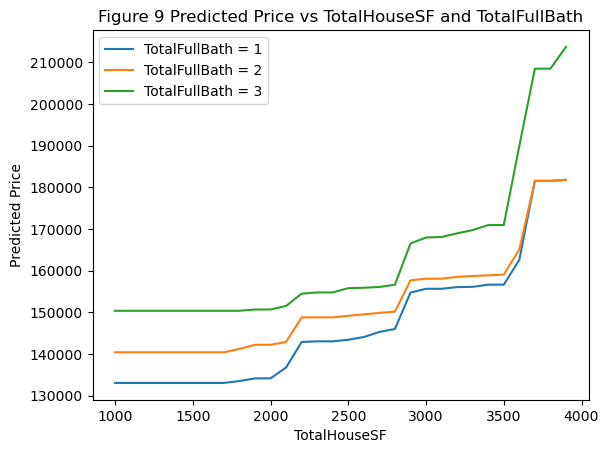

In [231]:
year_data = Xtrain_tree.copy()

# print(year_data.loc[2927, :])


year_lst=list(range(1000,3901,100))
year_lst

price_year_lst =[]
for j in [1,2,3]:
    price_year = []
    year_data.loc[2927, "TotalFullBath"] = j
    for i in year_lst:
        year_data.loc[2927, "TotalHouseSF"] = i
        price_year.append(np.round(regr.predict(np.array(year_data.loc[2927, :]).reshape(1, -1)),2)[0]) 
    price_year_lst.append(price_year)

for i in range(0,3):
    plt.plot(year_lst,price_year_lst[i],label = f"TotalFullBath = {i+1}")
plt.legend()
plt.xlabel("TotalHouseSF")
plt.ylabel("Predicted Price")
plt.title("Figure 9 Predicted Price vs TotalHouseSF and TotalFullBath")
plt.show()
# price_year = []
# for i in year_lst:
#     year_data.loc[105, "YearBuilt"] = i
#     price_year.append(np.round(regr.predict(np.array(year_data.loc[105, :]).reshape(1, -1)),2)) 

# plt.plot(year_lst,price_year,label = "TotalHouseSF = 2835 ft^2")


# price_year = []
# for i in year_lst:
#     year_data.loc[430, "YearBuilt"] = i
#     price_year.append(np.round(regr.predict(np.array(year_data.loc[430, :]).reshape(1, -1)),2)) 

# plt.plot(year_lst,price_year,label = "TotalHouseSF = 4300 ft^2")
# plt.yticks(np.arange(100000, 550001, 50000))
# plt.legend(loc="upper left")
# plt.xlabel("YearBuilt")
# plt.ylabel("Predicted Price")
# plt.title("Figure 8 Predicted Price vs YearBuilt")
# plt.show()


# analysis of rq4

In [233]:
from sklearn.model_selection import train_test_split,cross_val_score, KFold,validation_curve,GridSearchCV
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import r2_score as r2
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor


data_reg=pd.read_excel('data_reg.xlsx')
data_class=pd.read_excel('data_class.xlsx')
data_reg_prep=pd.read_excel('data_reg_prep.xlsx')
data_class_prep=pd.read_excel('data_class_prep.xlsx')

data_reg_temp = data_reg.drop("SalePrice",axis = 1)
cols_temp = ["OverallQual","OverallCond","IsRemodGar","IsRemod"]
data_reg_temp[cols_temp]=data_reg_temp[cols_temp].astype("object")

cat_cols = data_reg_temp.select_dtypes(include = "object").columns.tolist()
print(len(cat_cols))
print(cat_cols)

num_cols = data_reg_temp.select_dtypes(include="number").columns.tolist()
print(len(num_cols))
print(num_cols)

Xtrain,Xtest,Ytrain,Ytest = train_test_split(data_reg_temp,data_reg["SalePrice"],test_size =0.3,random_state=0)
Xtrain = Xtrain.sort_index()
Xtest = Xtest.sort_index()
Ytrain= Ytrain.sort_index()
Ytest = Ytest.sort_index()

Xtrain_index = Xtrain.index.tolist()
Xtest_index = Xtest.index.tolist()

Xtrain_cat = Xtrain[cat_cols]

Xtrain_num = Xtrain[num_cols]
train_mean= Xtrain_num.mean()
train_std = np.sqrt(Xtrain_num.var())

Xtest_cat = Xtest[cat_cols]
Xtest_num = Xtest[num_cols]

Xtrain_num_std = Xtrain_num.apply(lambda x: (x - x.mean()) / np.sqrt(x.var())) 
Xtest_num_std = Xtest_num.copy()
for i in num_cols:
    Xtest_num_std[i] = (Xtest_num_std[i] - train_mean[i]) / train_std[i]

#axis = 0 caculate the mean or var through columns ,which is the default value in apply
# data_num_nor = data_num[numeric_cols].apply(lambda x: (x - x.min()) / (x.max(axis=0) - x.min(axis=0)))

#dummy的话最好一起dummy，因为有可能 test dataset 没有一些分类，导致train和test 的dummy的维度不一致

cat_dummy = data_reg_temp[cat_cols].copy()
for i in cat_cols:
    dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
    cat_dummy = pd.concat([cat_dummy,dummy_df], axis=1)
    cat_dummy = cat_dummy.drop(i, axis = 1)
print(cat_dummy.shape) 

Xtest_cat_dummy = cat_dummy.iloc[Xtest_index,:]
Xtrain_cat_dummy = cat_dummy.iloc[Xtrain_index,:]

Xtrain_lr = pd.concat((Xtrain_num_std,Xtrain_cat_dummy),axis = 1)
Xtest_lr = pd.concat((Xtest_num_std,Xtest_cat_dummy),axis = 1)
Ytrain_lr = Ytrain
Ytest_lr = Ytest

Xtrain_tree = pd.concat((Xtrain_num,Xtrain_cat),axis = 1)
Xtest_tree = pd.concat((Xtest_num,Xtest_cat),axis = 1)
Ytrain_tree = data_class.iloc[Xtrain_index,:]["PriceLevel"]
Ytest_tree = data_class.iloc[Xtest_index,:]["PriceLevel"]

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Iterate through each column in Xtrain_tree
for column in Xtrain_tree.columns:
    # Check if the column is categorical (object data type)
    if Xtrain_tree[column].dtype == 'object':
        # Fit and transform the column with LabelEncoder
        Xtrain_tree[column] = label_encoder.fit_transform(Xtrain_tree[column])

for column in Xtest_tree.columns:
    # Check if the column is categorical (object data type)
    if Xtest_tree[column].dtype == 'object':
        # Fit and transform the column with LabelEncoder
        Xtest_tree[column] = label_encoder.fit_transform(Xtest_tree[column])

# Now Xtrain_tree contains the label-encoded categorical variables

20
['MSZoning', 'LotShape', 'HouseStyle', 'OverallQual', 'OverallCond', 'Exterior1st', 'MasVnrType', 'Foundation', 'BsmtQual', 'HeatingQC', 'CentralAir', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageQual', 'PavedDrive', 'SaleType', 'SaleCondition', 'IsRemodGar', 'IsRemod']
9
['LotArea', 'YearBuilt', 'MasVnrArea', 'Fireplaces', 'GarAreaPerCar', 'GrLivAreaPerRoom', 'TotalHouseSF', 'TotalFullBath', 'TotalPorchSF']
(2930, 125)


C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\1167463781.py:61: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\1167463781.py:61: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\1167463781.py:61: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dummy_df = pd.get_dummies(cat_dummy[i], prefix=i,dtype=int)
C:\Users\T480S\AppData\Local\Temp\ipykernel_18296\1167463781.py:61: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when

0.9980497318381277


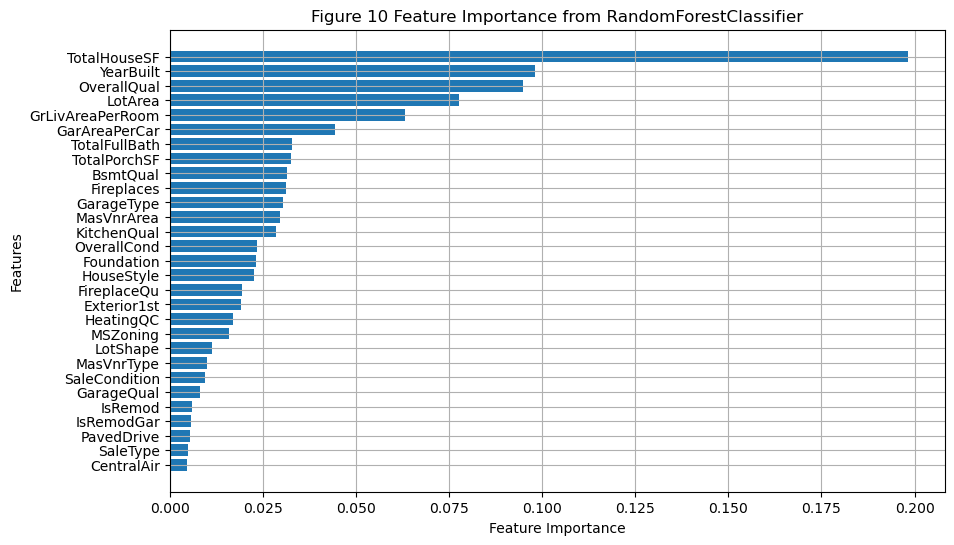

In [241]:
rfr = RandomForestClassifier(n_estimators = 201,max_depth = 14,min_samples_leaf = 1,\
                min_samples_split = 3,random_state = 0)

rfr.fit(Xtrain_tree,Ytrain_tree)
print(rfr.score(Xtrain_tree,Ytrain_tree))

feature_importance = rfr.feature_importances_

# 获取特征名字（假设Xtrain_tree是一个DataFrame）
feature_names = Xtrain_tree.columns

# 对特征重要性进行排序
sorted_idx = np.argsort(feature_importance)

# 绘制特征重要性条形图
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Figure 10 Feature Importance from RandomForestClassifier')
plt.grid()
plt.show()


In [ ]:
kf = KFold(n_splits=4, shuffle=True, random_state=0)
lst=[]
for i in range(10,100,20):
    parameters = { 'n_estimators':[201]
                    #,'criterion':["squared_error"]
                    ,"max_depth":[14]
                    ,'min_samples_leaf':[1]
                    ,'min_samples_split':[3]
                    }
    rfr = RandomForestClassifier(random_state=0)
    GS = GridSearchCV(rfr, parameters, cv=kf,scoring = "accuracy")
    GS.fit(Xtrain_tree,Ytrain_tree)
    
    a = GS.predict(Xtrain_tree)
    print(a)
    lst.append(GS.best_score_)

plt.plot(range(10,100,20),lst)

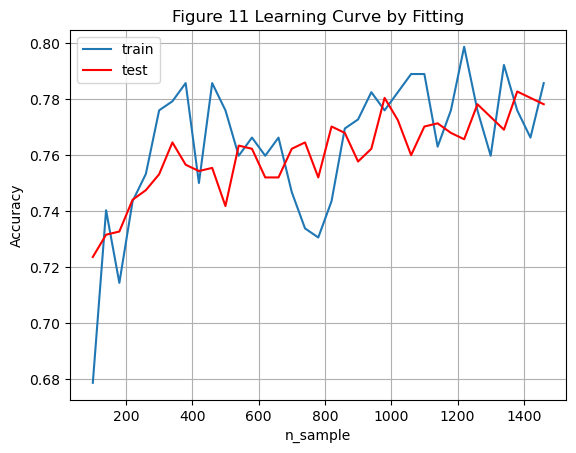

In [325]:
from sklearn.model_selection import ShuffleSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# 创建ShuffleSplit对象
ss = ShuffleSplit(n_splits=1, test_size=0.15, random_state=0)
ss1 = ShuffleSplit(n_splits=1, test_size=0.2, random_state=1)
# # 不同的n_estimators值
# n_estimators_values = [10, 30, 50, 70]

# # 存储每个n_estimators值对应的准确率
# accuracy_results = []
n_estimators = 201
# for n_estimators in n_estimators_values:
accuracies = []
accuracies_test = []
rfr = RandomForestClassifier(n_estimators=n_estimators, max_depth=14, min_samples_leaf=1, min_samples_split=3, random_state=0)

range1 = range(100,1500,40)

for train_index, test_index in ss.split(Xtrain_tree): #只有抽回的分一次
    # print(train_index,test_index)
    X_train, X_test = Xtrain_tree.iloc[train_index], Xtrain_tree.iloc[test_index]
    y_train, y_test = Ytrain_tree.iloc[train_index], Ytrain_tree.iloc[test_index]
    
    # for train_index, test_index in ss.split(Xtrain_tree): #利用ss1有抽回的得到测试集
    #     X_train1, X_test1 = Xtrain_tree.iloc[train_index], Xtrain_tree.iloc[test_index]
    #     y_train1, y_test1 = Ytrain_tree.iloc[train_index], Ytrain_tree.iloc[test_index]
        
    for j in range1:
        rfr.fit(X_train.iloc[0:j,:], y_train.iloc[0:j])
        
        y_pred = rfr.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
        
        y_pred_test = rfr.predict(Xtest_tree)
        accuracy_test = accuracy_score(Ytest_tree,y_pred_test)
        accuracies_test.append(accuracy_test)

plt.plot(range1,accuracies,label = "train")
plt.plot(range1,accuracies_test,color = "red",label = "test")
plt.xlabel('n_sample')
plt.ylabel('Accuracy')
plt.title('Figure 11 Learning Curve by Fitting')
plt.grid()
plt.legend()
plt.show()



In [314]:
Xtrain_tree.shape

(2051, 29)

In [260]:
Ytrain_tree.iloc[0:i]

0      Very High
1            Low
2           High
3      Very High
5           High
         ...    
129          Low
130          Low
131          Low
133       Medium
134         High
Name: PriceLevel, Length: 100, dtype: object

In [278]:
rfr1 = RandomForestClassifier(n_estimators=201, max_depth=14, min_samples_leaf=1, min_samples_split=3, random_state=0)
rfr1.fit(Xtrain_tree.iloc[0:2000,:], Ytrain_tree[0:2000])
accuracy = rfr1.score(Xtest_tree, Ytest_tree) 
accuracy

0.7918088737201365

0.6325369738339022
0.6928327645051194
0.732650739476678
0.7303754266211604
0.7337883959044369
0.7303754266211604
0.7258248009101251
0.7474402730375427
0.7474402730375427
0.7588168373151308
0.764505119453925
0.7679180887372014
0.7622298065984073
0.7633674630261661
0.7690557451649602
0.7667804323094426
0.770193401592719
0.7588168373151308
0.7588168373151308
0.7656427758816837
0.7804323094425484
0.7747440273037542
0.7736063708759955
0.7588168373151308
0.770193401592719
0.7667804323094426
0.764505119453925
0.7736063708759955


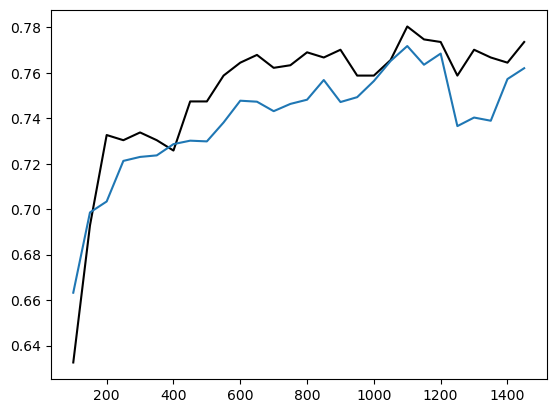

In [282]:
result_r = []
result_r1 = []
for i in range(100, 1501, 20):
    rfr1 = RandomForestClassifier(n_estimators=201, max_depth=14, min_samples_leaf=1, min_samples_split=3, random_state=0)
    rfr1.fit(Xtrain_tree.iloc[0:i,:], Ytrain_tree[0:i])
    accuracy = rfr1.score(Xtest_tree, Ytest_tree)  # 计算测试集上的正确率
    print(accuracy)
    if i >= 2000:
        accuracy1 = rfr1.score(Xtrain_tree.iloc[2000::,:], Ytrain_tree[2000::]) 
    else:
        accuracy1 = rfr1.score(Xtrain_tree.iloc[i::,:], Ytrain_tree[i::]) 
    result_r.append(accuracy)
    result_r1.append(accuracy1)
plt.plot(range(100, 1501, 20),result_r,color = "black")
plt.plot(range(100, 1501, 20),result_r1)

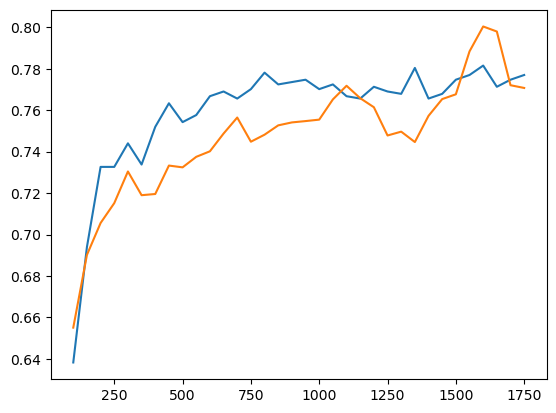

In [269]:
plt.plot(range(100, 1800, 50),result_r)
plt.plot(range(100, 1800, 50),result_r1)

In [250]:
print(result_r)

[0.7531285551763367, 0.7736063708759955, 0.78839590443686, 0.7929465301478953, 0.7974971558589306]


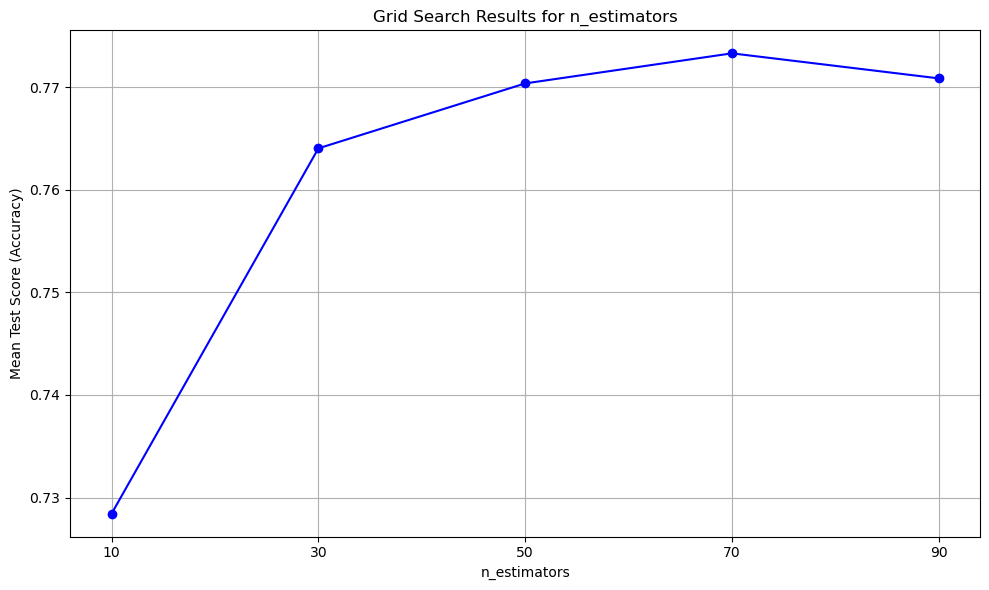

In [245]:
import matplotlib.pyplot as plt
import pandas as pd

results = pd.DataFrame(GS.cv_results_)
estimators_accuracy = results.groupby("param_n_estimators")["mean_test_score"].agg("mean")

plt.figure(figsize=(10, 6))
plt.plot(estimators_accuracy.index, estimators_accuracy.values, marker='o', linestyle='-', color='b')
plt.title("Grid Search Results for n_estimators")
plt.xlabel("n_estimators")
plt.ylabel("Mean Test Score (Accuracy)")
plt.grid(True)
plt.xticks(estimators_accuracy.index)
plt.tight_layout()

plt.show()



In [ ]:
lst_ = ["built","HouseStyle","GarageType","LotShape"]
data_ = data1[lst_location]
value_counts = []
for i in lst_location:
    value_counts_temp = data[i].value_counts(dropna=False)
    print(i,value_counts_temp)
    value_counts.append(value_counts_temp)
    
str_MSZonging = '''A~Agriculture, C~Commercial, FV~Floating Village Residential 
    I~Industrial RH~Residential High Density, RL~Residential Low Density
    RP~Residential Low Density Park, RM~Residential Medium Density
    '''
title_MSZonging = '''MSZonging: the general zoning classification'''

1122.6725412880455 2.5924998361470904e-239


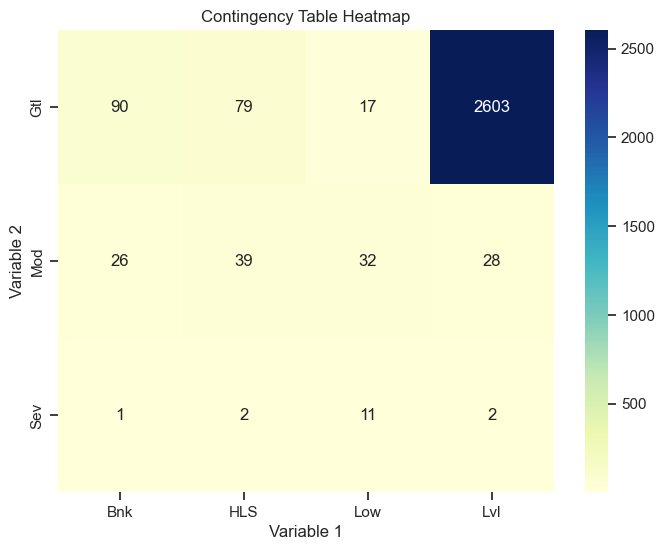

In [13]:
lst_geo = ["LotShape","LandContour","LandSlope"]
data_geo = data[lst_geo].astype("object")
data_geo.describe()
observed = pd.crosstab(data_geo['LandSlope'], data_geo['LandContour'])

# 执行卡方检验
chi2, p_value, _, _ = chi2_contingency(observed)
print(chi2,p_value)
plt.figure(figsize=(8, 6))
sns.heatmap(observed, annot=True, cmap='YlGnBu', fmt='d')
plt.xlabel('Variable 1')
plt.ylabel('Variable 2')
plt.title('Contingency Table Heatmap')
plt.show()

Heating GasA     2885
GasW       27
Grav        9
Wall        6
OthW        2
Floor       1
Name: Heating, dtype: int64
CentralAir Y    2734
N     196
Name: CentralAir, dtype: int64
Electrical SBrkr    2682
FuseA     188
FuseF      50
FuseP       8
None        1
Mix         1
Name: Electrical, dtype: int64
Fireplaces 0    1422
1    1274
2     221
3      12
4       1
Name: Fireplaces, dtype: int64
MiscFeature None    2824
Shed      95
Gar2       5
Othr       4
Elev       1
TenC       1
Name: MiscFeature, dtype: int64


C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\1316081103.py:55: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


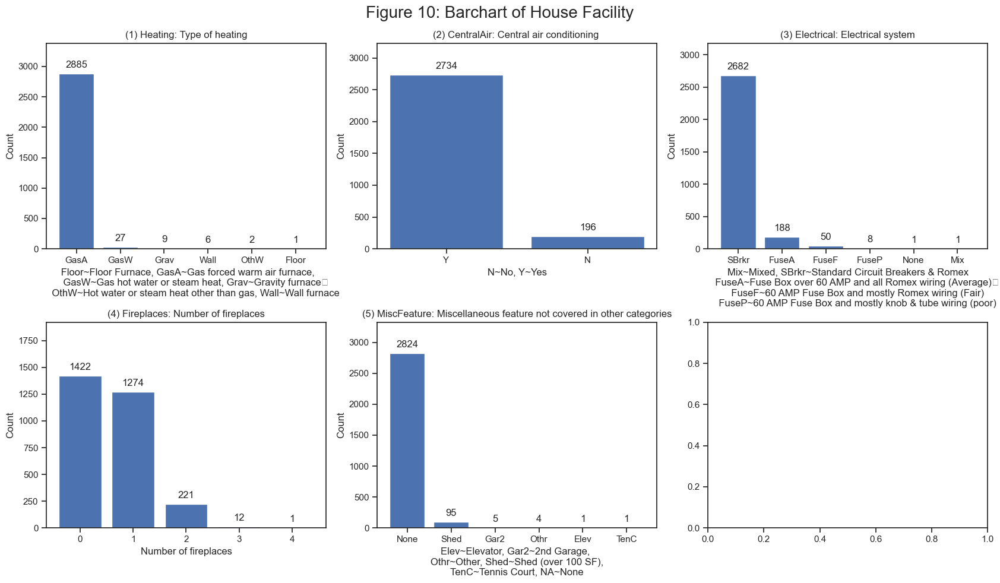

In [14]:
lst_facility = ["Heating","CentralAir","Electrical","Fireplaces","MiscFeature"]
data_facility = data[lst_facility]
value_counts = []
for i in lst_facility:
    value_counts_temp = data[i].value_counts(dropna=False)
    print(i,value_counts_temp)
    value_counts.append(value_counts_temp)
    
str_Heating = ''' Floor~Floor Furnace, GasA~Gas forced warm air furnace,
       GasW~Gas hot water or steam heat, Grav~Gravity furnace	
       OthW~Hot water or steam heat other than gas, Wall~Wall furnace'''
title_Heating = '''Heating: Type of heating'''

str_CentralAir = '''N~No, Y~Yes'''
title_CentralAir = '''CentralAir: Central air conditioning '''

str_Electrical = '''Mix~Mixed, SBrkr~Standard Circuit Breakers & Romex
       FuseA~Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF~60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP~60 AMP Fuse Box and mostly knob & tube wiring (poor)'''
title_Electrical = '''Electrical: Electrical system'''
		
title_Fireplaces = '''Fireplaces: Number of fireplaces'''
str_Fireplaces = '''Number of fireplaces'''

title_MiscFeature = '''MiscFeature: Miscellaneous feature not covered in other categories'''
str_MiscFeature = '''Elev~Elevator, Gar2~2nd Garage, 
Othr~Other, Shed~Shed (over 100 SF),
TenC~Tennis Court, NA~None'''		


	   
title = [title_Heating,title_CentralAir,title_Electrical,title_Fireplaces,title_MiscFeature]
str_ = [str_Heating,str_CentralAir,str_Electrical,str_Fireplaces,str_MiscFeature]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17, 10))

fig.suptitle('Figure 10: Barchart of House Facility',fontsize=20)

for i, column in enumerate(data_facility):
   
    value_counts_location = data_facility[column].value_counts()
    
    ax = axes[i//3, i%3]  
    ax.bar(value_counts_location.index, value_counts_location.values)
    ax.set_title(f"({i+1}) "+title[i])

    ax.set_xlabel(str_[i])
    ax.set_ylabel('Count')
    
    ax.set_ylim(0,max(data_facility[column].value_counts())+500)
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'bottom', xytext = (0, 5), textcoords = 'offset points')
plt.tight_layout()
plt.show()

C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\511733940.py:17: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
d:\working software\Anaconda3\envs\bigdata\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


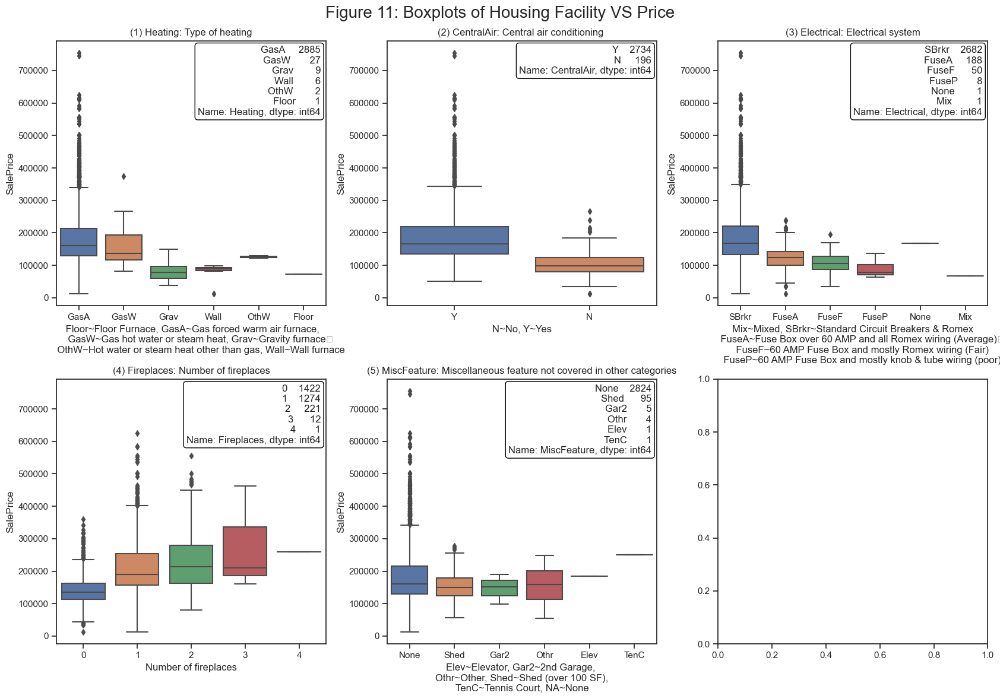

In [15]:
data_boxplot = pd.concat([data_facility, data['SalePrice']], axis=1)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17, 12))

fig.suptitle('Figure 11: Boxplots of Housing Facility VS Price',fontsize=20)

for i, column in enumerate(data_facility):
    ax = axes[i//3, i%3]  # 获取当前子图的轴对象
    sns.boxplot(x=column, y='SalePrice', data=data_boxplot,ax=ax,order=value_counts[i].index)
    
    ax.set_title(f"({i+1}) {title[i]}")
    
    ax.set_xlabel(str_[i])
    ax.set_ylabel('SalePrice')
    ax.text(0.98, 0.98, f'{value_counts[i]}', transform=ax.transAxes,
                ha='right', va='top', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

plt.tight_layout()
plt.show()

In [53]:
any(data["GarageQual"] == "None")


False

OverallQual 5     825
6     732
7     602
8     350
4     226
9     107
3      40
10     31
2      13
1       4
Name: OverallQual, dtype: int64
OverallCond 5    1654
6     533
7     390
8     144
4     101
3      50
9      41
2      10
1       7
Name: OverallCond, dtype: int64
HeatingQC Ex    1495
TA     864
Gd     476
Fa      92
Po       3
Name: HeatingQC, dtype: int64
KitchenQual TA    1494
Gd    1160
Ex     205
Fa      70
Po       1
Name: KitchenQual, dtype: int64
BsmtQual TA     1283
Gd     1219
Ex      258
Fa       88
NaN      80
Po        2
Name: BsmtQual, dtype: int64
GarageQual TA     2615
NaN     159
Fa      124
Gd       24
Po        5
Ex        3
Name: GarageQual, dtype: int64


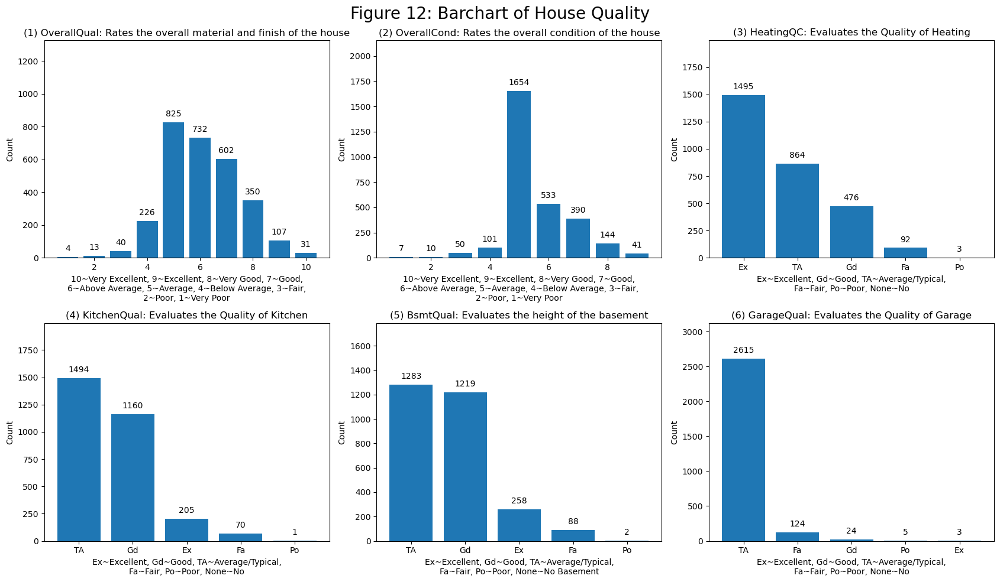

In [58]:
lst_quality = ["OverallQual","OverallCond",'HeatingQC','KitchenQual','BsmtQual','GarageQual']
data_quality= data[lst_quality]
value_counts = []
for i in lst_quality:
    value_counts_temp = data[i].value_counts(dropna=False)
    print(i,value_counts_temp)
    value_counts.append(value_counts_temp)

title_OverallQual = '''OverallQual: Rates the overall material and finish of the house'''
str_OverallQual = '''10~Very Excellent, 9~Excellent, 8~Very Good, 7~Good,
6~Above Average, 5~Average, 4~Below Average, 3~Fair,
2~Poor, 1~Very Poor'''
	
title_OverallCond = '''OverallCond: Rates the overall condition of the house'''
str_OverallCond = '''10~Very Excellent, 9~Excellent, 8~Very Good, 7~Good,
6~Above Average, 5~Average, 4~Below Average, 3~Fair,
2~Poor, 1~Very Poor'''

title_BsmtQual = '''BsmtQual: Evaluates the height of the basement'''
str_BsmtQual = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No Basement'''
		
title_HeatingQC = '''HeatingQC: Evaluates the Quality of Heating'''
str_HeatingQC = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No'''

title_KitchenQual = '''KitchenQual: Evaluates the Quality of Kitchen'''
str_KitchenQual = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No'''

title_GarageQual = '''GarageQual: Evaluates the Quality of Garage'''
str_GarageQual = '''Ex~Excellent, Gd~Good, TA~Average/Typical,
Fa~Fair, Po~Poor, None~No'''
title = [title_OverallQual,title_OverallCond,title_HeatingQC,title_KitchenQual,title_BsmtQual,title_GarageQual]
str_ = [str_OverallQual,str_OverallCond,str_HeatingQC,str_KitchenQual,str_BsmtQual,str_GarageQual]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17, 10))

fig.suptitle('Figure 12: Barchart of House Quality',fontsize=20)

for i, column in enumerate(data_quality):
   
    value_counts_location = data_quality[column].value_counts()
    
    ax = axes[i//3, i%3]  
    ax.bar(value_counts_location.index, value_counts_location.values)
    ax.set_title(f"({i+1}) "+title[i])

    ax.set_xlabel(str_[i])
    ax.set_ylabel('Count')
    
    ax.set_ylim(0,max(data_quality[column].value_counts())+500)
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'bottom', xytext = (0, 5), textcoords = 'offset points')
plt.tight_layout()
plt.show()

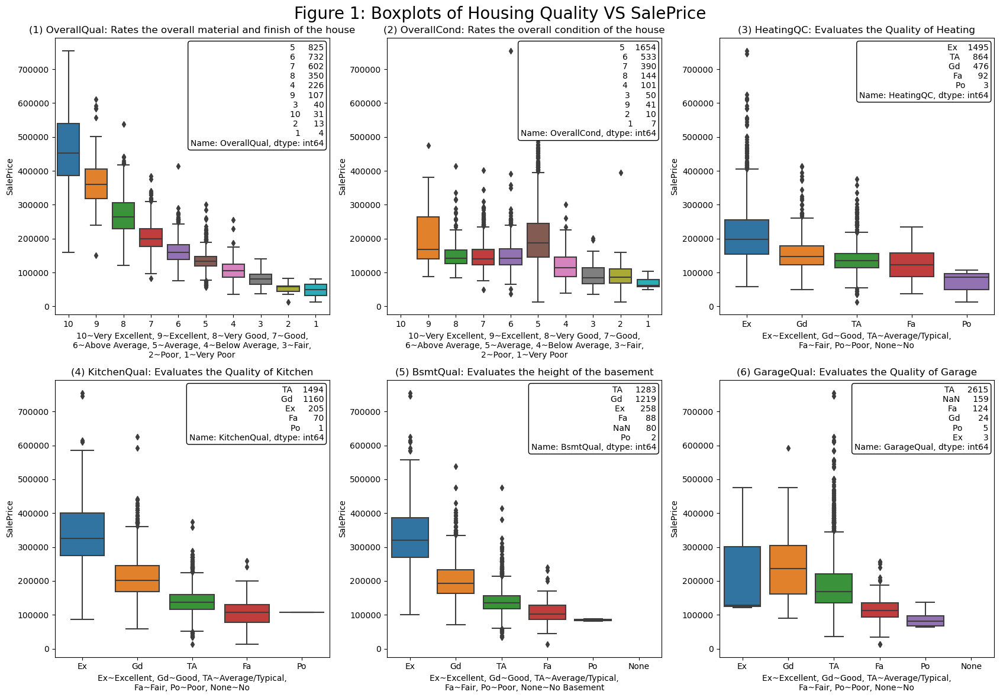

In [60]:
data_boxplot = pd.concat([data_quality, data['SalePrice']], axis=1)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17, 12))

fig.suptitle('Figure 1: Boxplots of Housing Quality VS SalePrice',fontsize=20)

for i, column in enumerate(data_quality):
    if i == 1 or i == 0:
        order = list(range(10, 0, -1))
    elif i ==2 or i == 3:
        order = ['Ex','Gd',	'TA','Fa','Po']
    else:
        order = ['Ex','Gd',	'TA','Fa','Po','None']
    ax = axes[i//3, i%3]  
    sns.boxplot(x=column, y='SalePrice', data=data_boxplot,ax=ax,order=order)
    
    ax.set_title(f"({i+1}) {title[i]}")
    
    ax.set_xlabel(str_[i])
    ax.set_ylabel('SalePrice')
    ax.text(0.98, 0.98, f'{value_counts[i]}', transform=ax.transAxes,
                ha='right', va='top', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

plt.tight_layout()
plt.show()

RoofStyle Gable      2321
Hip         551
Gambrel      22
Flat         20
Mansard      11
Shed          5
Name: RoofStyle, dtype: int64
RoofMatl CompShg    2887
Tar&Grv      23
WdShake       9
WdShngl       7
Membran       1
ClyTile       1
Roll          1
Metal         1
Name: RoofMatl, dtype: int64
Exterior1st VinylSd    1026
MetalSd     450
HdBoard     442
Wd Sdng     420
Plywood     221
CemntBd     126
BrkFace      88
WdShing      56
AsbShng      44
Stucco       43
BrkComm       6
AsphShn       2
CBlock        2
Stone         2
PreCast       1
ImStucc       1
Name: Exterior1st, dtype: int64
Exterior2nd VinylSd    1015
MetalSd     447
HdBoard     406
Wd Sdng     397
Plywood     274
CmentBd     126
Wd Shng      81
Stucco       47
BrkFace      47
AsbShng      38
Brk Cmn      22
ImStucc      15
Stone         6
AsphShn       4
CBlock        3
PreCast       1
Other         1
Name: Exterior2nd, dtype: int64
MasVnrType None       1775
BrkFace     880
Stone       249
BrkCmn       25
CBlock 

C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\3826622997.py:51: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(value_counts_location.index, rotation=60)
C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\3826622997.py:51: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(value_counts_location.index, rotation=60)
C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\3826622997.py:51: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(value_counts_location.index, rotation=60)


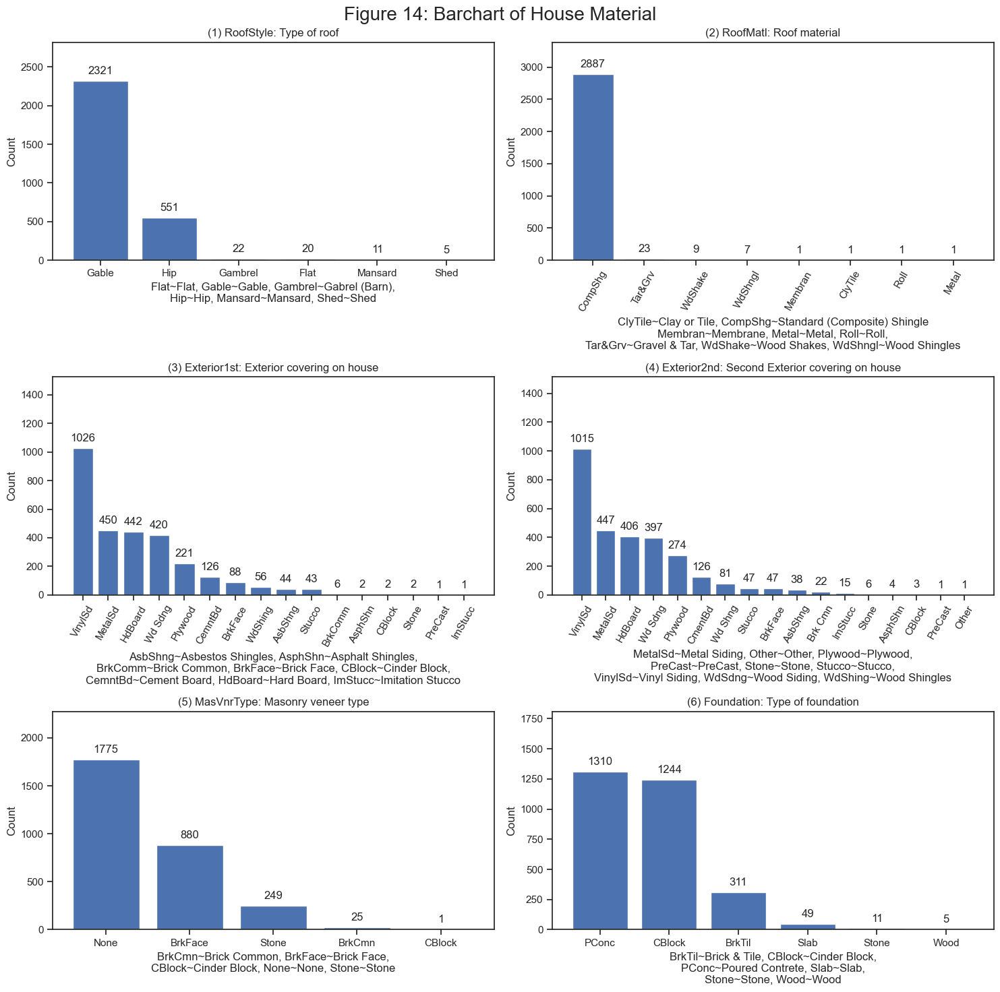

In [18]:
lst_material = ["RoofStyle","RoofMatl","Exterior1st","Exterior2nd","MasVnrType","Foundation"]
data_material= data[lst_material]
value_counts = []
for i in lst_material:
    value_counts_temp = data[i].value_counts(dropna=False)
    print(i,value_counts_temp)
    value_counts.append(value_counts_temp)

title_RoofStyle = "RoofStyle: Type of roof"
str_RoofStyle = '''Flat~Flat, Gable~Gable, Gambrel~Gabrel (Barn),
Hip~Hip, Mansard~Mansard, Shed~Shed'''
		
title_RoofMatl = "RoofMatl: Roof material"
str_RoofMatl = '''ClyTile~Clay or Tile, CompShg~Standard (Composite) Shingle
Membran~Membrane, Metal~Metal, Roll~Roll,
Tar&Grv~Gravel & Tar, WdShake~Wood Shakes, WdShngl~Wood Shingles'''

title_Exterior1st = "Exterior1st: Exterior covering on house"
str_Exterior1st = '''AsbShng~Asbestos Shingles, AsphShn~Asphalt Shingles,
BrkComm~Brick Common, BrkFace~Brick Face, CBlock~Cinder Block,
CemntBd~Cement Board, HdBoard~Hard Board, ImStucc~Imitation Stucco'''

title_Exterior2nd = "Exterior2nd: Second Exterior covering on house"
str_Exterior2nd = '''MetalSd~Metal Siding, Other~Other, Plywood~Plywood,
PreCast~PreCast, Stone~Stone, Stucco~Stucco,
VinylSd~Vinyl Siding, WdSdng~Wood Siding, WdShing~Wood Shingles'''

title_MasVnrType = "MasVnrType: Masonry veneer type"
str_MasVnrType = '''BrkCmn~Brick Common, BrkFace~Brick Face,
CBlock~Cinder Block, None~None, Stone~Stone'''

title_Foundation = "Foundation: Type of foundation"
str_Foundation = '''BrkTil~Brick & Tile, CBlock~Cinder Block,
PConc~Poured Contrete, Slab~Slab,
Stone~Stone, Wood~Wood'''

title = [title_RoofStyle,title_RoofMatl,title_Exterior1st,title_Exterior2nd,title_MasVnrType,title_Foundation]
str_ = [str_RoofStyle,str_RoofMatl,str_Exterior1st,str_Exterior2nd,str_MasVnrType,str_Foundation]

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

fig.suptitle('Figure 14: Barchart of House Material',fontsize=20)

for i, column in enumerate(data_material):
   
    value_counts_location = data_material[column].value_counts()
    
    ax = axes[i//2, i%2]  
    ax.bar(value_counts_location.index, value_counts_location.values)
    if i > 0 and i < 4:
        ax.set_xticklabels(value_counts_location.index, rotation=60)
    ax.set_title(f"({i+1}) "+title[i])
    ax.set_xlabel(str_[i])
    ax.set_ylabel('Count')
    
    ax.set_ylim(0,max(data_material[column].value_counts())+500)
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'bottom', xytext = (0, 5), textcoords = 'offset points')
plt.tight_layout()
plt.show()

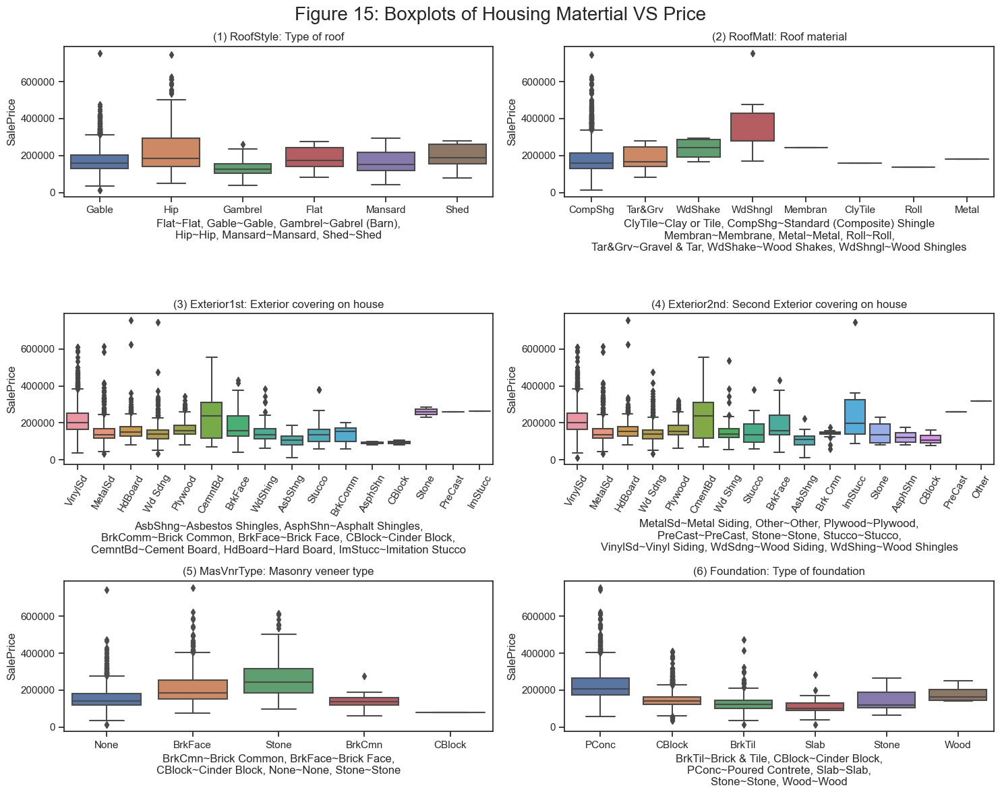

In [19]:
data_boxplot = pd.concat([data_material, data['SalePrice']], axis=1)
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 12))

fig.suptitle('Figure 15: Boxplots of Housing Matertial VS Price',fontsize=20)

for i, column in enumerate(data_material):
    ax = axes[i//2, i%2]  # 获取当前子图的轴对象
    sns.boxplot(x=column, y='SalePrice', data=data_boxplot,ax=ax,order=value_counts[i].index)
    
    ax.set_title(f"({i+1}) {title[i]}")
    ax.set_ylabel('SalePrice')
    
    ax.set_xlabel(str_[i])
    if i > 1 and i < 4:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
    
    if i <= 1 and i >= 4:
        ax.text(0.98, 0.98, f'{value_counts[i]}', transform=ax.transAxes,\
                ha='right', va='top', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

plt.tight_layout()
plt.show()

In [20]:
# Categorial vs categorial
 

In [21]:
col_lst = ["MSSubClass","OverallQual","OverallCond"]
data[col_lst] = data[col_lst].astype(object)

categorical_cols = data.select_dtypes(include=['object','category']).columns.tolist()
numeric_cols = data.select_dtypes(include='number').columns.tolist()

data_cat = data[categorical_cols]
data_num = data[numeric_cols]
print(len(categorical_cols))
print(len(numeric_cols))

47
36


In [22]:
from scipy import stats
response_var = 'SalePrice'  #or 'SalePrice' log
CATVAL, DF = 0,1  #C style enum type. See note below.
arg_list = []  #argument list for f oneway() function.
res_list = []  #result list with tuples: (f-score, p-value)

for cat in categorical_cols:
    #create cat feature value wise groups of the main dataframe.
    group_list = list(data.groupby(cat))  #get the groups into a list one dataframe per
    #cat value.
    #Structure of this array: Array of tuples - first element is cat value, second element is dataframe.
    #Note: Use the enum values above to traverse through group list.
    
    for grp in group_list:  #group gets tuples: (cat-val, df with selected cat-val)
        arg_list.append(grp[DF][response_var].values)
        #arg_list now has a list of response variable columns, one for each category value.
        
    #Apply the one-way Kruskal-Wallis (non-parametric) ANOVA.
    h_value, p_value = stats.kruskal(*arg_list) 
    res_list.append((cat,h_value,p_value))
    
fvalue_df = pd.DataFrame(res_list, columns = ['cat', 'h_value', 'p_value'])
#We have a dataframe with f/h scores and p-values; we need to pick the best n indicating strongest
#correlation.
fvalue_df.sort_values(['p_value','h_value'], ascending = [True,False], inplace = True)
fvalue_df.reset_index(drop = True, inplace = True) #resetting the index gives us an advantage.
#If two categories are related as shown by the chi square test, we can pick the one that has a 
#lower value as that will be more strongly correlated to the response variable.
#fvalue_df.iloc[:,:].to_excel('Kruskal-Wallis (non-parametric) ANOVA.xlsx', index=False)

In [23]:
from itertools import combinations
from scipy import stats
import math
data_cat = data[categorical_cols]
cat_pairs = combinations(data_cat, 2) #tuples with pairs of features.
chisq_df_rows = []  #Prepare to create a dataframe.
# for c in cat_pairs:
#     print(c)
N = data_cat.shape[0]  #number of observations or rows.
for cat1, cat2 in cat_pairs:
    cat_crosstab = pd.crosstab(data_cat[cat1], data_cat[cat2], normalize=False)
    chisq,p,dof,_ = stats.chi2_contingency(cat_crosstab) #_ is 'expected' crosstab table
    #for Cramer's V
    k = min(len(data_cat[cat1].unique()), len(data_cat[cat2].unique()))
    cramersV = math.sqrt(chisq/(N*(k-1)))
    chisq_df_rows.append((cat1, cat2, chisq, p, cramersV, k))
    
chisq_df = pd.DataFrame(chisq_df_rows, columns = ['Cat1','Cat2','chisq','p','Cramers V','dof'])
#create dataframe with the data.
chisq_df.sort_values(by='Cramers V', ascending=False, inplace=True)
chisq_table = chisq_df[chisq_df['Cramers V'] > 0.5]
chisq_table
#chisq_table.to_excel('chisq_table.xlsx', index=False)

,Cat1,Cat2,chisq,p,Cramers V,dof
11,MSSubClass,BldgType,9296.404394,0.0,0.890623,5
12,MSSubClass,HouseStyle,14188.453915,0.0,0.831734,8
675,Exterior1st,Exterior2nd,24232.113768,0.0,0.742534,16
1026,GarageType,GarageFinish,4134.265877,0.0,0.685812,4
1045,GarageQual,GarageCond,5774.219475,0.0,0.627809,6
559,OverallQual,ExterQual,3332.512503,0.0,0.615732,4
1036,GarageFinish,GarageQual,3094.068829,0.0,0.593295,4
1037,GarageFinish,GarageCond,3050.720290,0.0,0.589124,4
767,ExterQual,KitchenQual,2611.599108,0.0,0.545078,4
53,MSZoning,Neighborhood,5200.279332,0.0,0.543881,7


Text(0.5, 209.24999999999997, "A threshold of 0.5 was applied to determine the correlation strength between categorical variables. \n    A Cramer's V value exceeding 0.5 indicates a strong correlation between the variables. \n    Conversely, categorical variables with Cramer's V values less than 0.5 are considered to exhibit weak correlations with each other.")

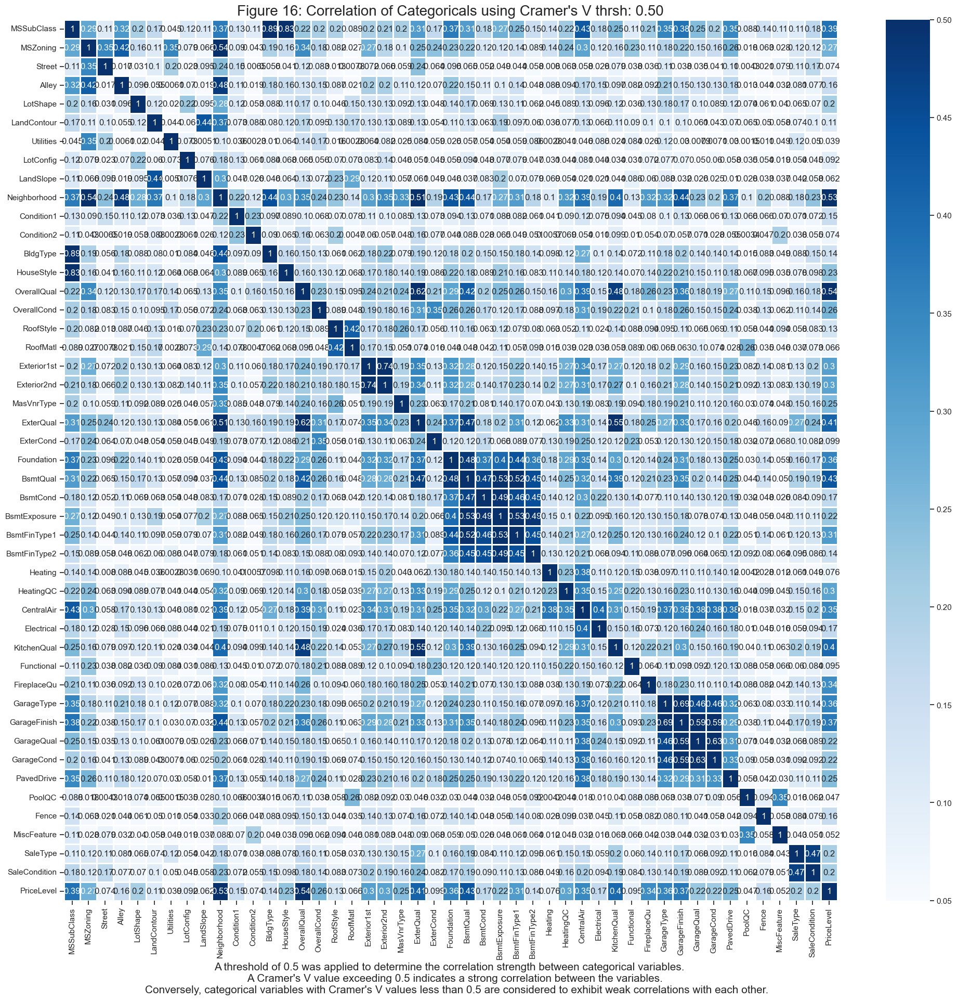

In [24]:
#Create a square dataframe with to hold Cramer's V values
cat_corr_df = pd.DataFrame(0, columns=categorical_cols, index=categorical_cols)

#extract the three vectors we want: 
# cat1, cat2 and 'Cramers V' -- zip them and then populate corr. matrix
cat_corr_tup = zip(chisq_df['Cat1'],chisq_df['Cat2'],chisq_df['Cramers V'])

for cat1, cat2, crv in cat_corr_tup:
    #Now that we have the coordinates and values, populate the cat_corr_df
    cat_corr_df.loc[cat1,cat2] = crv
    cat_corr_df.loc[cat2,cat1] = crv  #symmetry across diagonal.
    cat_corr_df.loc[cat1,cat1] = cat_corr_df.loc[cat2,cat2] = 1 # 1 along diagonals.
    
plt.figure(figsize=(24,22))
vmax = 0.50
vmin = 0.05
sns.heatmap(cat_corr_df, annot=True, cmap="Blues", linewidths=1, linecolor='white', fmt="0.2g",vmax=vmax,vmin=vmin)
#choosing vmin, vmax helps us map the operative part of the annotation range to the entire color-bar range.
#we choose vmin=0.05 and vmax=0.50 based on the guidance value of Cramer's V for the minimum dof of 4.
plt.title("Figure 16: Correlation of Categoricals using Cramer's V thrsh: %.2f"%vmax, fontdict={'fontsize':20})
plt.xlabel("A threshold of 0.5 was applied to determine the correlation strength between categorical variables. \n\
    A Cramer's V value exceeding 0.5 indicates a strong correlation between the variables. \n\
    Conversely, categorical variables with Cramer's V values less than 0.5 are considered to exhibit weak correlations with each other.", fontdict={'fontsize':15})

C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\111895088.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(s.index, rotation=90)


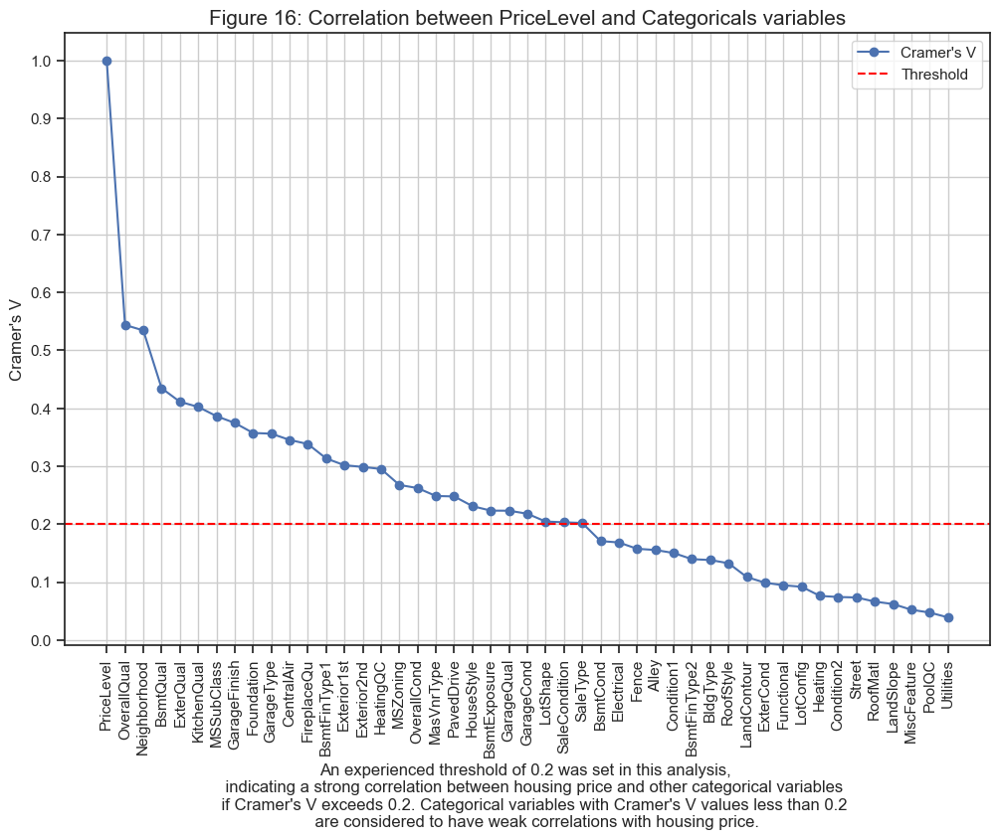

In [25]:
s = cat_corr_df.loc['PriceLevel'].sort_values(ascending = False)
cmv_thresholds = 0.2
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(s.index, s.values, marker='o',label='Cramer\'s V')

ax.set_title('Figure 16: Correlation between PriceLevel and Categoricals variables',fontdict={'fontsize':15})
ax.set_xticklabels(s.index, rotation=90)
ax.set_xlabel("An experienced threshold of 0.2 was set in this analysis, \n\
    indicating a strong correlation between housing price and other categorical variables \n\
    if Cramer's V exceeds 0.2. Categorical variables with Cramer's V values less than 0.2 \n\
    are considered to have weak correlations with housing price.")
ax.set_yticks([i/10 for i in range(11)])
ax.set_ylabel('Cramer\'s V')

ax.axhline(y=cmv_thresholds, color='red', linestyle='--', label='Threshold')
ax.legend()
ax.grid(True)

plt.show()



In [26]:
cmv_thresh_abovecols = [] 
cmv_thresh_belowcols = []
for i in s.index:
    if s[i] > cmv_thresholds:
        cmv_thresh_abovecols.append(i)
    else:
        cmv_thresh_belowcols.append(i)
cmv_thresh_abovecols.remove("PriceLevel")

cmv_thresh_abovecols
cmv_thresh_belowcols

# del_cat_cols = cmv_thresh_belowcols
# for i  in categorical_del_cols:
#     if i not in del_cat_cols:
#         del_cat_cols.append(i)
#         print(i)

    
# len(del_cat_cols)


['BsmtCond',
 'Electrical',
 'Fence',
 'Alley',
 'Condition1',
 'BsmtFinType2',
 'BldgType',
 'RoofStyle',
 'LandContour',
 'ExterCond',
 'Functional',
 'LotConfig',
 'Heating',
 'Condition2',
 'Street',
 'RoofMatl',
 'LandSlope',
 'MiscFeature',
 'PoolQC',
 'Utilities']

In [27]:
print(len(cmv_thresh_abovecols))
print(len(cmv_thresh_belowcols))
cmv_thresh_abovecols
categorical_cols

26
20


['MSSubClass',
 'MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition',
 'PriceLevel']

In [28]:
categorical_del_cols= ['MSSubClass','Exterior2nd','GarageFinish',\
    'ExterQual','Neighborhood','BsmtExposure','BsmtFinType1','GarageCond']
for i in categorical_del_cols:
    categorical_cols.remove(i)
    
data_cat = data[categorical_cols]
cat_pairs = combinations(data_cat, 2) #tuples with pairs of features.
chisq_df_rows = []  #Prepare to create a dataframe.
# for c in cat_pairs:
#     print(c)
N = data_cat.shape[0]  #number of observations or rows.
for cat1, cat2 in cat_pairs:
    cat_crosstab = pd.crosstab(data_cat[cat1], data_cat[cat2], normalize=False)
    chisq,p,dof,_ = stats.chi2_contingency(cat_crosstab) #_ is 'expected' crosstab table
    #for Cramer's V
    k = min(len(data_cat[cat1].unique()), len(data_cat[cat2].unique()))
    cramersV = math.sqrt(chisq/(N*(k-1)))
    chisq_df_rows.append((cat1, cat2, chisq, p, cramersV, k))
    
chisq_df = pd.DataFrame(chisq_df_rows, columns = ['Cat1','Cat2','chisq','p','Cramers V','dof'])    
cat_pairs = combinations(data_cat, 2) #tuples with pairs of features.
chisq_df_rows = []  #Prepare to create a dataframe.
# for c in cat_pairs:
#     print(c)
N = data_cat.shape[0]  #number of observations or rows.
for cat1, cat2 in cat_pairs:
    cat_crosstab = pd.crosstab(data_cat[cat1], data_cat[cat2], normalize=False)
    chisq,p,dof,_ = stats.chi2_contingency(cat_crosstab) #_ is 'expected' crosstab table
    #for Cramer's V
    k = min(len(data_cat[cat1].unique()), len(data_cat[cat2].unique()))
    cramersV = math.sqrt(chisq/(N*(k-1)))
    chisq_df_rows.append((cat1, cat2, chisq, p, cramersV, k))
    
chisq_df = pd.DataFrame(chisq_df_rows, columns = ['cat1','cat2','chisq','p','Cramers V','dof'])
#create dataframe with the data.
# chisq_df.sort_values(by='Cramers V', ascending=False, inplace=True)
# chisq_table = chisq_df[chisq_df['Cramers V'] > 0.5]
# chisq_table

In [29]:
chisq_df

,cat1,cat2,chisq,p,Cramers V,dof
0,MSZoning,Street,359.555306,1.370346e-74,0.350307,2
1,MSZoning,Alley,1031.107548,3.839313e-213,0.419472,3
2,MSZoning,LotShape,214.971118,9.957305e-36,0.156385,4
3,MSZoning,LandContour,100.581457,1.733011e-13,0.106971,4
4,MSZoning,Utilities,731.932767,6.409168e-149,0.353416,3
...,...,...,...,...,...,...
736,MiscFeature,SaleCondition,38.680984,3.964176e-02,0.051384,6
737,MiscFeature,PriceLevel,23.997937,6.512852e-02,0.052251,4
738,SaleType,SaleCondition,3272.556191,0.000000e+00,0.472634,6
739,SaleType,PriceLevel,359.040147,1.022949e-59,0.202105,4


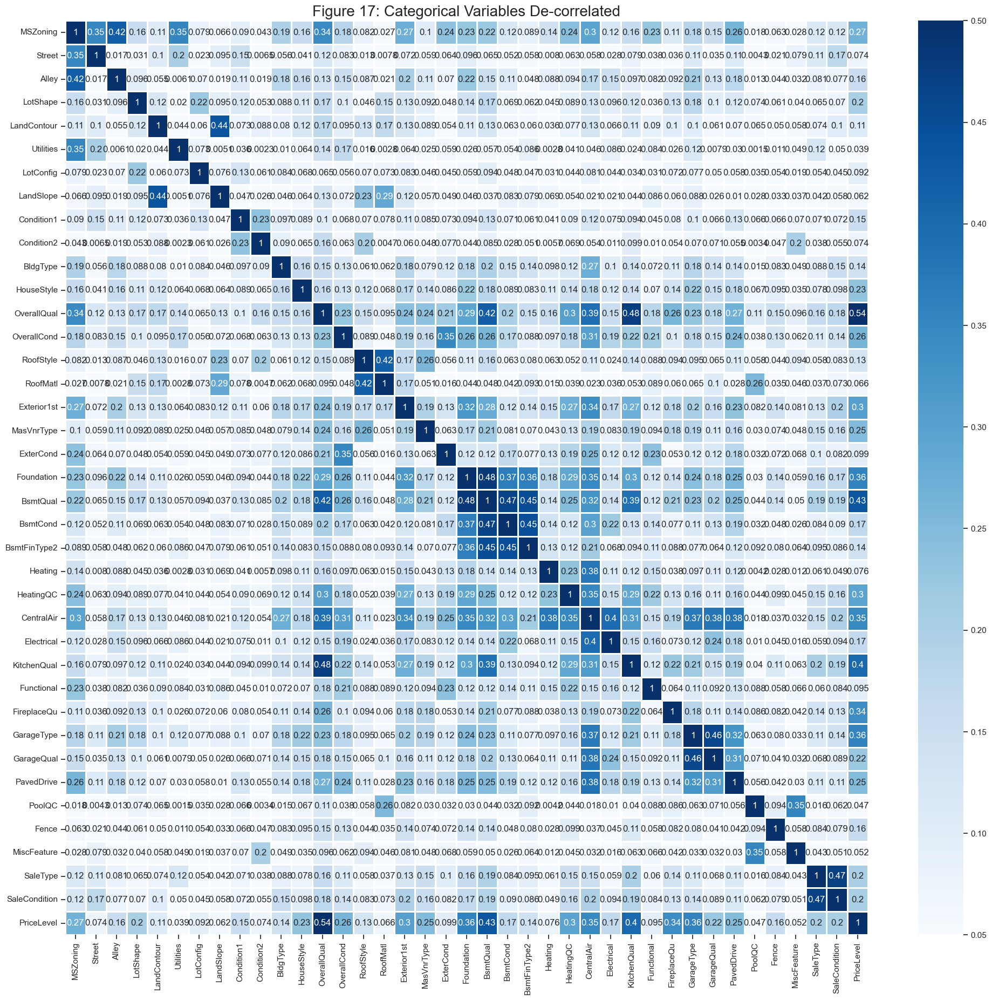

In [30]:

cat_corr_df = pd.DataFrame(0, columns=categorical_cols, index=categorical_cols)

#extract the three vectors we want: 
# cat1, cat2 and 'Cramers V' -- zip them and then populate corr. matrix
cat_corr_tup = zip(chisq_df['cat1'],chisq_df['cat2'],chisq_df['Cramers V'])

for cat1, cat2, crv in cat_corr_tup:
    #Now that we have the coordinates and values, populate the cat_corr_df
    cat_corr_df.loc[cat1,cat2] = crv
    cat_corr_df.loc[cat2,cat1] = crv  #symmetry across diagonal.
    cat_corr_df.loc[cat1,cat1] = cat_corr_df.loc[cat2,cat2] = 1 # 1 along diagonals.
    
plt.figure(figsize=(24,22))
vmax = 0.50
vmin = 0.05
sns.heatmap(cat_corr_df, annot=True, cmap="Blues", linewidths=1, linecolor='white', fmt="0.2g",vmax=vmax,vmin=vmin)
#choosing vmin, vmax helps us map the operative part of the annotation range to the entire color-bar range.
#we choose vmin=0.05 and vmax=0.50 based on the guidance value of Cramer's V for the minimum dof of 4.
plt.title("Figure 17: Categorical Variables De-correlated", fontdict={'fontsize':20})
plt.show()

In [31]:
del_cat_cols = cmv_thresh_belowcols
for i  in categorical_del_cols:
    if i not in del_cat_cols:
        del_cat_cols.append(i)
        print(i)
res_cat_cols = data_cat.columns
    
print(len(del_cat_cols))
del_cat_cols
res_cat_cols = data_cat.columns.tolist()
for i in del_cat_cols:
    if i in res_cat_cols:
        res_cat_cols.remove(i)
res_cat_cols.remove('PriceLevel')
print(len(res_cat_cols))
res_cat_cols

MSSubClass
Exterior2nd
GarageFinish
ExterQual
Neighborhood
BsmtExposure
BsmtFinType1
GarageCond
28
18


['MSZoning',
 'LotShape',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'Exterior1st',
 'MasVnrType',
 'Foundation',
 'BsmtQual',
 'HeatingQC',
 'CentralAir',
 'KitchenQual',
 'FireplaceQu',
 'GarageType',
 'GarageQual',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

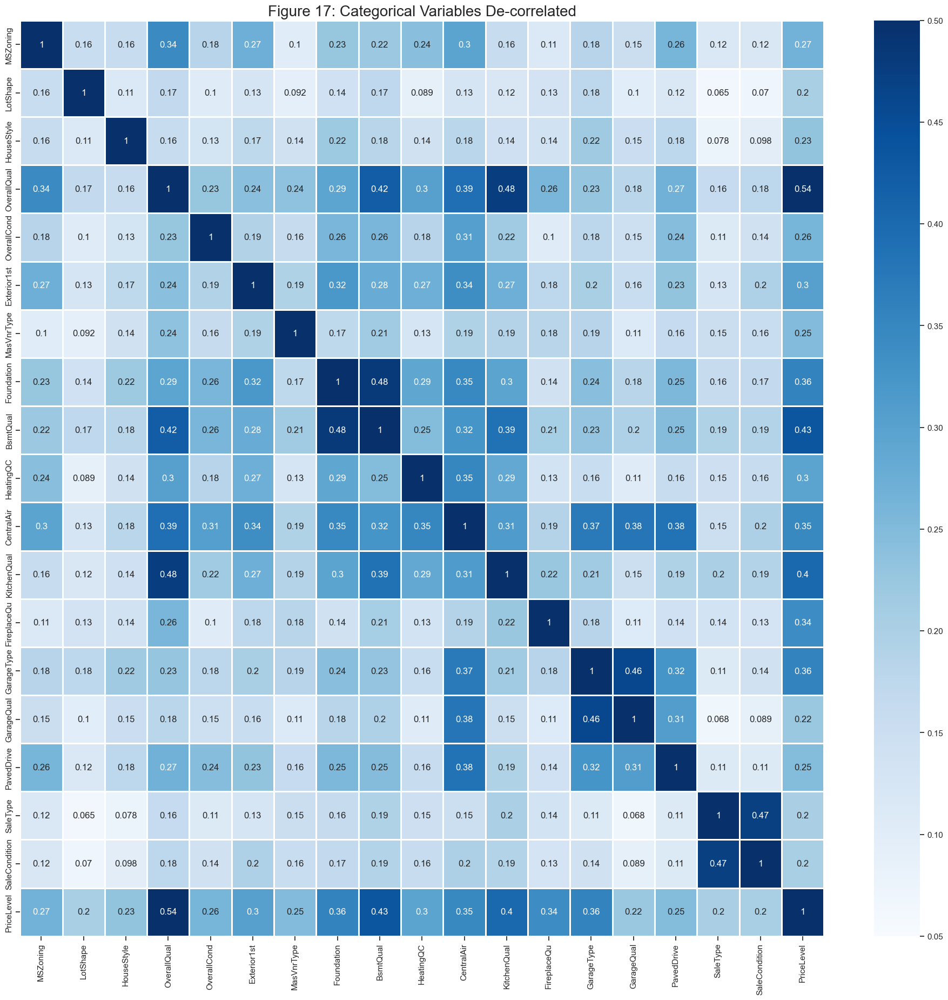

In [32]:
data_cat = data[res_cat_cols+["PriceLevel"]]
cat_pairs = combinations(data_cat, 2) #tuples with pairs of features.
chisq_df_rows = []  #Prepare to create a dataframe.
# for c in cat_pairs:
#     print(c)
N = data_cat.shape[0]  #number of observations or rows.
for cat1, cat2 in cat_pairs:
    cat_crosstab = pd.crosstab(data_cat[cat1], data_cat[cat2], normalize=False)
    chisq,p,dof,_ = stats.chi2_contingency(cat_crosstab) #_ is 'expected' crosstab table
    #for Cramer's V
    k = min(len(data_cat[cat1].unique()), len(data_cat[cat2].unique()))
    cramersV = math.sqrt(chisq/(N*(k-1)))
    chisq_df_rows.append((cat1, cat2, chisq, p, cramersV, k))
    
chisq_df = pd.DataFrame(chisq_df_rows, columns = ['cat1','cat2','chisq','p','Cramers V','dof']) 
cat_corr_df = pd.DataFrame(0, columns=res_cat_cols, index=res_cat_cols)

#extract the three vectors we want: 
# cat1, cat2 and 'Cramers V' -- zip them and then populate corr. matrix
cat_corr_tup = zip(chisq_df['cat1'],chisq_df['cat2'],chisq_df['Cramers V'])
for cat1, cat2, crv in cat_corr_tup:
    #Now that we have the coordinates and values, populate the cat_corr_df
    cat_corr_df.loc[cat1,cat2] = crv
    cat_corr_df.loc[cat2,cat1] = crv  #symmetry across diagonal.
    cat_corr_df.loc[cat1,cat1] = cat_corr_df.loc[cat2,cat2] = 1 # 1 along diagonals.
    
plt.figure(figsize=(24,22))
vmax = 0.50
vmin = 0.05
sns.heatmap(cat_corr_df, annot=True, cmap="Blues", linewidths=1, linecolor='white', fmt="0.2g",vmax=vmax,vmin=vmin)
#choosing vmin, vmax helps us map the operative part of the annotation range to the entire color-bar range.
#we choose vmin=0.05 and vmax=0.50 based on the guidance value of Cramer's V for the minimum dof of 4.
plt.title("Figure 17: Categorical Variables De-correlated", fontdict={'fontsize':20})
plt.show()

# Numerical Vs Numerical Variable

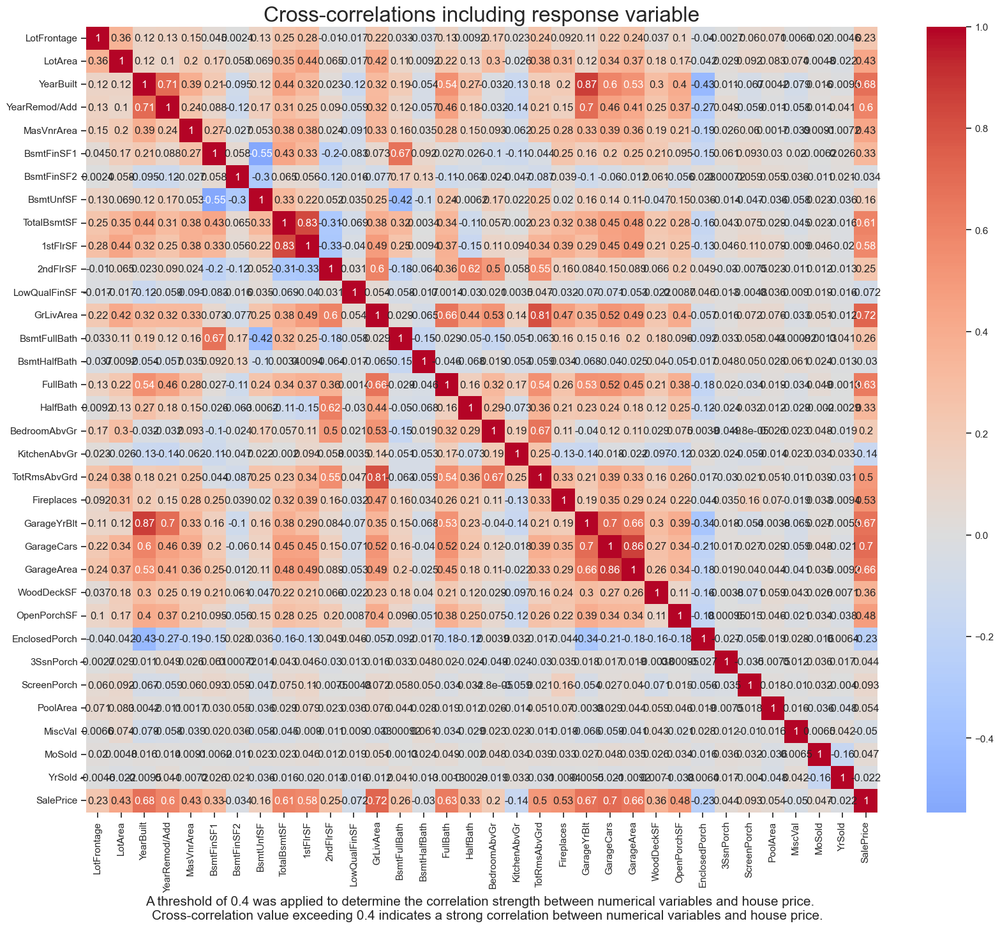

In [33]:
data_num = data[numeric_cols].drop(['PID','Order'],axis=1)
fig, ax = plt.subplots(1,1, figsize=(20,16))
full_corr_df = data_num.corr('spearman')
ax.set_title("Cross-correlations including response variable", fontsize=24)
sns.heatmap(full_corr_df, annot=True, cmap="coolwarm",center=0, ax=ax)
plt.xlabel("A threshold of 0.4 was applied to determine the correlation strength between numerical variables and house price. \n\
    Cross-correlation value exceeding 0.4 indicates a strong correlation between numerical variables and house price. \n\
    ", fontdict={'fontsize':15})
plt.show()

C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\4047411613.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(s.index, rotation=90)


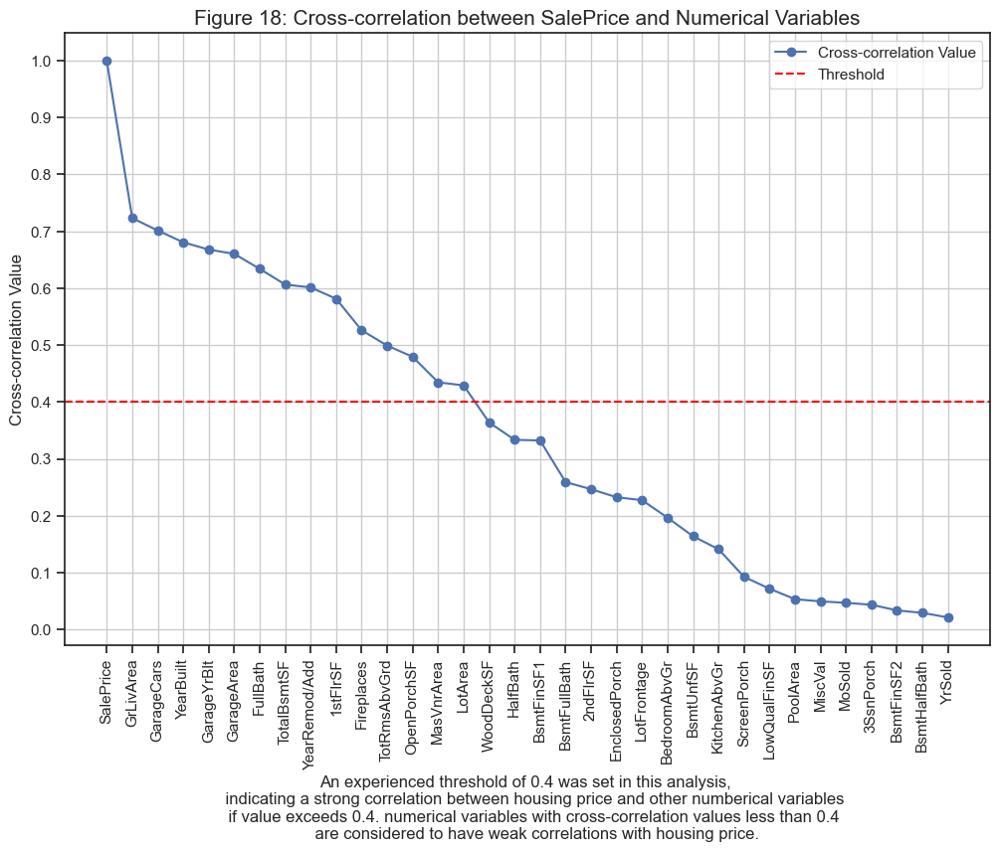

In [34]:
s = abs(full_corr_df['SalePrice']).sort_values(ascending= False)

cross_thresholds = 0.4
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(s.index, s.values, marker='o',label='Cross-correlation Value')

ax.set_title('Figure 18: Cross-correlation between SalePrice and Numerical Variables',fontdict={'fontsize':15})
ax.set_xticklabels(s.index, rotation=90)
ax.set_xlabel("An experienced threshold of 0.4 was set in this analysis, \n\
    indicating a strong correlation between housing price and other numberical variables \n\
    if value exceeds 0.4. numerical variables with cross-correlation values less than 0.4 \n\
    are considered to have weak correlations with housing price.")
ax.set_yticks([i/10 for i in range(11)])
ax.set_ylabel('Cross-correlation Value')

ax.axhline(y=cross_thresholds, color='red', linestyle='--', label='Threshold')
ax.legend()
ax.grid(True)

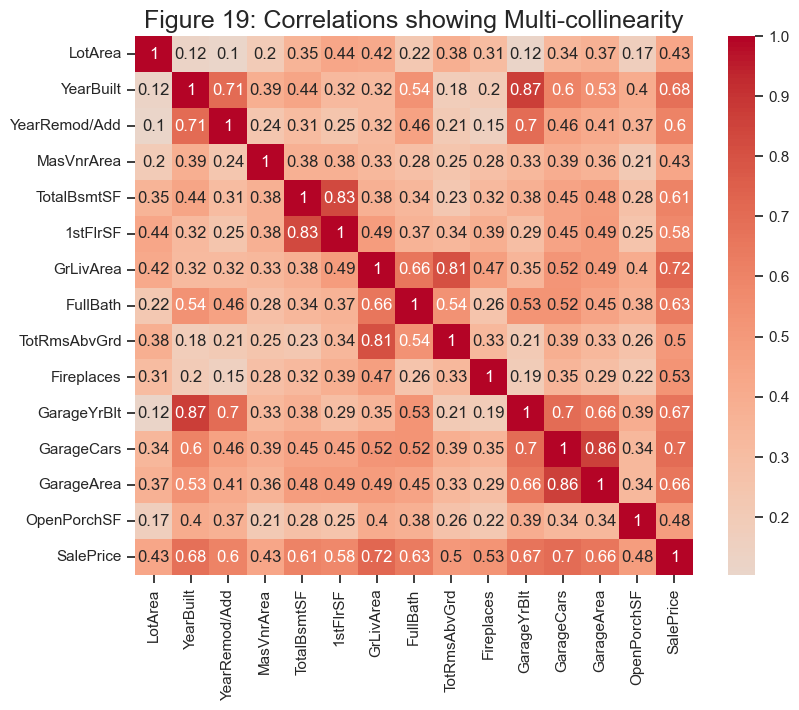

In [35]:
#cross_thresholds = 0.4

corr_features = list(full_corr_df[abs(full_corr_df['SalePrice'])>cross_thresholds].index)

#Features noticably correlated to 'SalePrice'
corr_features.remove('SalePrice')
corr_features 

fig, ax = plt.subplots(1,1, figsize=(9,7))
multi_coll_df = data_num[corr_features+['SalePrice']].corr('spearman')
ax.set_title("Figure 19: Correlations showing Multi-collinearity", fontsize=18)
sns.heatmap(multi_coll_df, annot=True, cmap="coolwarm", center=0, ax=ax)

cross_abovecols = corr_features
cross_belowcols = []
temp = data_num.columns.tolist()
for i in temp:
    if i not in cross_abovecols:
        cross_belowcols.append(i)
        
cross_belowcols.remove("SalePrice")
#print(cross_belowcols)    

In [113]:
data1 = data.copy()
data1["GarAreaPerCar"] = (data1["GarageArea"] / data1["GarageCars"]).fillna(0)
data1["GrLivAreaPerRoom"] = data1["GrLivArea"] / data1["TotRmsAbvGrd"]
data1["TotalHouseSF"] = data1["TotalBsmtSF"] + data1["1stFlrSF"] + data1["2ndFlrSF"]
data1["IsRemodGar"] = (data1["GarageYrBlt"] - data1["YearBuilt"]).apply(lambda x: '1' if x > 0 else '0')
# whether Garage is built after house finish: 1 ~yes, 0 ~no
data1['TotalPorchSF'] = data1['OpenPorchSF'] + data1['EnclosedPorch'] + data1['3SsnPorch'] + data1['ScreenPorch']
data1["TotalFullBath"] = data1["FullBath"] + data1["BsmtFullBath"]
data1["IsRemod"] = (data1["YearRemod/Add"] - data1["YearBuilt"]).apply(lambda x: '1' if x > 0 else '0')
data_temp = data1[cross_abovecols+['IsRemodGar','GarAreaPerCar','GrLivAreaPerRoom','TotalHouseSF','TotalFullBath','TotalPorchSF','IsRemod']]
data_temp.drop(['GarageYrBlt','GarageArea','GarageCars','GrLivArea','FullBath','TotRmsAbvGrd','TotalBsmtSF','1stFlrSF','OpenPorchSF',"YearRemod/Add"],axis = 1,inplace = True)

C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\2047975802.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_temp.drop(['GarageYrBlt','GarageArea','GarageCars','GrLivArea','FullBath','TotRmsAbvGrd','TotalBsmtSF','1stFlrSF','OpenPorchSF',"YearRemod/Add"],axis = 1,inplace = True)


C:\Users\T480S\AppData\Local\Temp\ipykernel_17644\3147897570.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  select_corr_df = data_temp.corr('spearman')


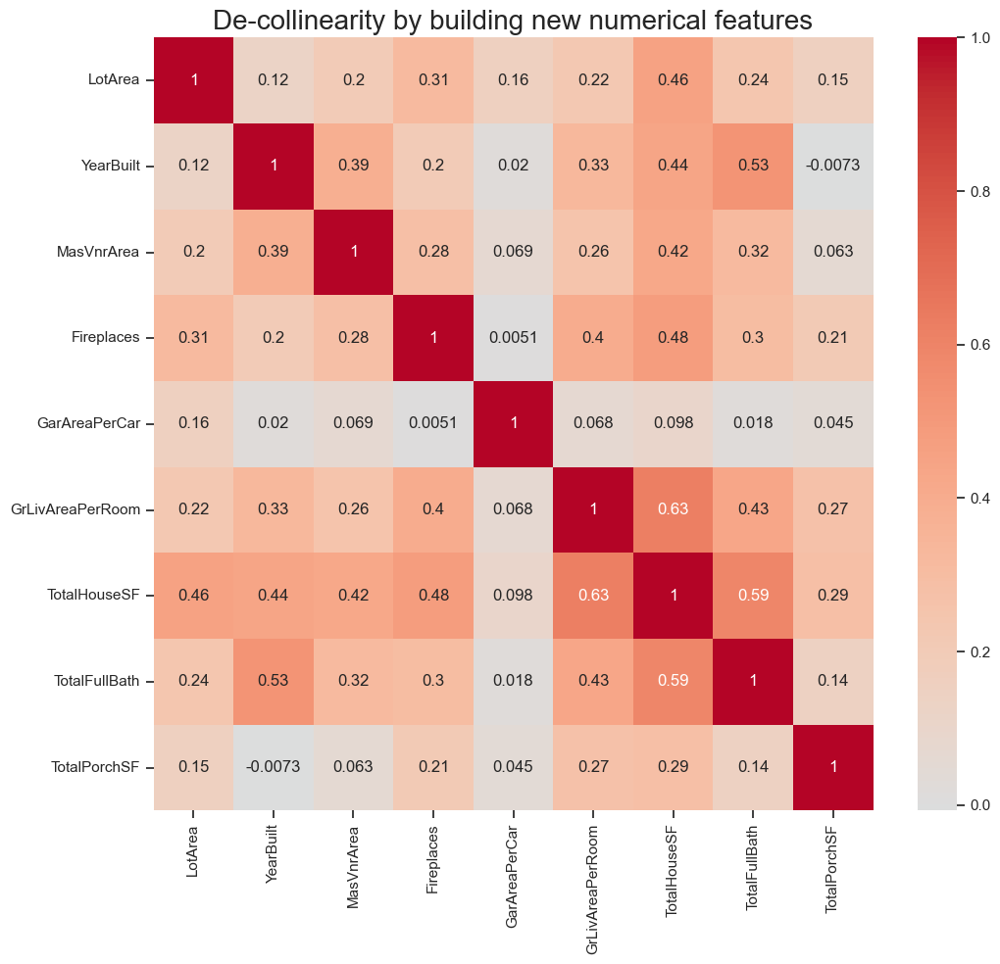

In [114]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(11, 10))
select_corr_df = data_temp.corr('spearman')
ax1 = axes
ax1.set_title("De-collinearity by building new numerical features", fontsize=20)
sns.heatmap(select_corr_df, annot=True, cmap="coolwarm",center=0, ax=ax1)
# #plt.xlabel("A threshold of 0.4 was applied to determine the correlation strength between numerical variables and house price. \n\
#     Cross-correlation value exceeding 0.4 indicates a strong correlation between numerical variables and house price. \n\
#     ", fontdict={'fontsize':15})
plt.tight_layout()
plt.show()

In [115]:
cols_with_nan = data_temp.columns[data_temp.isnull().any()]
cols_with_nan
print("the number of columns with Nan Value is "f'{len(cols_with_nan)}')
data_num_temp = data_temp.copy()



the number of columns with Nan Value is 0


In [116]:
data_cat_temp = data1[res_cat_cols]
data_cat_temp
cols_with_nan = data_cat_temp.columns[data_cat_temp.isnull().any()]
cols_with_nan
print("the number of columns with Nan Value is "f'{len(cols_with_nan)}')

the number of columns with Nan Value is 0


In [120]:
cat_cols = data_cat_temp.columns.tolist() + data_num_temp.select_dtypes(include='object').columns.tolist()
num_cols = data_num_temp.select_dtypes(include='number').columns.tolist()
print(len(cat_cols))
data_fs = pd.concat((data_cat_temp,data_num_temp),axis = 1)
data_cat = data_fs[cat_cols]
data_num = data_fs[num_cols]

data_num_scale = data_num_temp[num_cols].apply(lambda x: (x - x.mean()) / np.sqrt(x.var())) 
#axis = 0 caculate the mean or var through columns ,which is the default value in apply
# data_num_nor = data_num[numeric_cols].apply(lambda x: (x - x.min()) / (x.max(axis=0) - x.min(axis=0)))

data_cat_dummy = data_cat.copy()
for i in cat_cols:
    dummy_df = pd.get_dummies(data_cat_dummy[i], prefix=i,dtype=int)
    data_cat_dummy = pd.concat([data_cat_dummy,dummy_df], axis=1)
    data_cat_dummy = data_cat_dummy.drop(i, axis = 1)
print(data_cat_dummy.shape) 

# print(data.info())
# print(data.describe())
#print(data_cat.describe().loc['unique'].sum())


data_reg = pd.concat((data_num,data_cat,data["SalePrice"]),axis = 1)
data_class = pd.concat((data_num,data_cat,data["PriceLevel"]),axis = 1)
data_reg_prep = pd.concat((data_num_scale,data_cat_dummy,data["SalePrice"]),axis = 1)
data_class_prep = pd.concat((data_num_scale,data_cat_dummy,data["PriceLevel"]),axis = 1)





20
(2930, 125)


KeyError: 'PriceLevel'

In [108]:
data_reg.to_excel('data_reg.xlsx', index=False)
data_class.to_excel('data_class.xlsx', index=False)
data_reg_prep.to_excel('data_reg_prep.xlsx', index=False)
data_class_prep.to_excel('data_class_prep.xlsx', index=False)